<a href="https://colab.research.google.com/github/sa-vn/AI-CNN/blob/main/Energy_Consumption_Prediction_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Energy Consumption Prediction Using a Hybrid Transformer and LSTM Model**

## **Abstract**

In this project Two models, using deep learning models are implemented. A Transformer Encoder-Decoder and lSTM and a Transformer Encoder plus LSTM and Transformer Decoder. A data set including Real energy consumption data from a Concordia University building was used for training, testing, and evaluation. After returning predictions to the original scale, the models were compared based on RMSE, relative RMSE, and MAE. The Transformer-LSTM model achieved the best performance with relative RMSE 18.76%.

## **Introduction**

This project aims to build and evaluate a deep learning-based hybrid building energy consumption prediction. The proposed two models of combination Encoder Decoder Transformer network and the LSTM network, to capture long-term dependencies and enhance short-term ones. The dataset used is actual energy consumption data from Concordia University building. Two versions of the Transformer and LSTM components were implemented and compared for the best model performance. Also, a baseline Transformer Encoder-Decoder model was employed as a point of comparison. The primary evaluation criterias are Mean Absolute Error (MAE) and Root Mean Squared Error (RMSE).
Regarding Previous work, various efforts have been made to improve the performance of time series forecasting models, particularly for energy consumption prediction. One notable study is the work by Haitao Wang et al [1]. In this research, a hybrid model that combines the attention mechanism of the just Transformer encoder with LSTM is proposed. In this work by the strength of Transformers in capturing long-term dependencies and the memory capabilities of LSTM, their model achieved better performance compared to traditional RNN, and standalone LSTM models.

## **Methodology**
**Data Preprocessing:**

* Dataset

 The dataset used in this project is part of the real-world energy consumption data from Concordia University Hall building. It is a time-series dataset, consisting of one year energy consumption for each 15 minuets. This dataset was then divided into training, validation with a split ratio of 80, 20% respectively. For the test set, in inference functions, a part of Concordia University Hall buildings data of year 2022 is used. To prepare the data, the energy measurements were normalized to a fixed scale to improve model convergence during training. The input sequences were structured as 96 past time steps to predict 96 future time steps. No additional external features such as weather conditions or occupancy rates were included; the model was trained purely on historical energy usage data.

 To prepare the data, I follow these steps. First, after ordering the dataset base on the date, the input sequence with length (L=96) and output sequence with length ped_ln=96 were created and then, the input and output data were normalized. To monitor the data by tensorboard, the related date also were captured in the corresponding arrays.

* Normalization

When I trained my models on raw energy values (which ranged from ~600 to ~2400), Initial loss was extremely large (over 1 million) [Figure1], leading to unstable training, exploding gradients and cause nan values. The model needed strong gradient clipping and also the model was sensitive to the learning rate and required smaller batch sizes. Without normalization, I made to reduce the learning rate drastically (e.g., lr=1e-4) and use gradient clipping. Moreover, the model requires by far more epochs to convergence and so the training time increase extremely.
With normalization, I could train faster and use higher learning rates more safely. To some up with Normalization Model convergence is much faster, smoother, and more stable.  Therefore, to speed up the model training and improve accuracy, in this project the data is first normalized using the Torch.StandardScaler(), so that all values data belongs to the normal distribution. Then, a sliding time window is established for data sampling.


 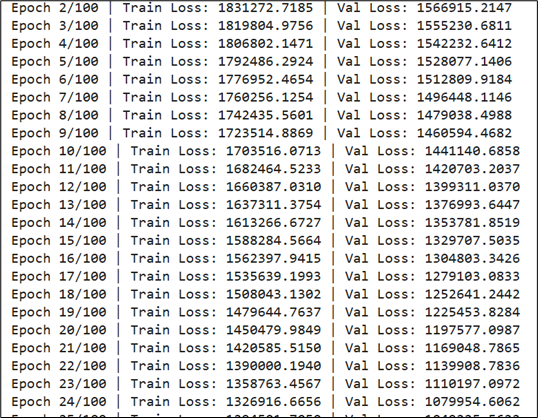

Figure 1: the part of training epochs, representing the high value of loss before normalization

•	Models

The Transformer encoder-decoder structure is effective at capturing long-term dependencies one reason is that its self-attention mechanism allows the model to connect any two-time steps directly, regardless of their distance in the sequence. This makes it highly suitable for modeling complex, long-range patterns such as daily trends. On the other hand, the LSTM is more specializes in short-term sequential modeling. Although LSTMs have mechanisms like gates and cell states to preserve information over time, they still tend to forget distant information in very long sequences (Goodfellow et al., 2016). Therefore, LSTMs are more effective for refining local patterns in consecutive time steps.
In this project it is tried to implementing two models by combination of encoder, decoder and lstm Methods.

1)	Transformer Encoder + LSTM+ Transformer Decoder

The Transformer Encoder acts as a feature extractor by creating a rich representation of the input sequence. Through its attention mechanism, it is able to capture long-distance dependencies in the data. This encoded representation is then passed to the LSTM layer, which focuses on modeling short-term dynamics and refining the sequence information before prediction. Finally, a Transformer Decoder generates the output predictions step-by-step based on the LSTM outputs. By combining both methods, the model is expected to achieve better prediction accuracy.
Model structure:

The model first projects the 1-dimensional input sequence into a high-dimensional space (d_model) and adds positional information. The Transformer encoder captures global dependencies across the sequence. The Transformer decoder generates an intermediate sequence. The LSTM processes this intermediate sequence to reinforce local temporal patterns. Finally, a linear layer predicts the future values (one value per timestep).


2)	Transformer Encoder + Transformer Decoder+ LSTM

The Transformer Encoder first processes the input sequence and creates a high-dimensional feature representation by capturing long-distance dependencies by its attention mechanism. Then the Transformer Decoder uses this encoded information to generate an initial output sequence. After decoding, the sequence is passed to an LSTM layer, which focuses on refining short-term dependencies and smoothing the sequence. By placing the LSTM after the Transformer Decoder, the model benefits from both global attention-based sequence modeling and local memory refinement.

batch_size: Number of sequences in each batch.
src_len: Length of the input time series (number of time steps).
tgt_len: Length of the target prediction sequence.
d_model: Dimension of the feature space after projection.
lstm_hidden_size: Hidden size of the LSTM output after decoding.



*Hyperparameter Search and Model Selection*

 Hyperparameter optimization is an important step to improve the performance of the model. There are different types of optimization algorithms, such as random search, grid search, Bayesian optimization. In this project, I apply the grid search method to find the best hyperparameter combinations. Since the deep learning model have several hyperparameters like the model dimension, the number of attention heads, the dropout rate, and hidden size, finding optimized values can help improve model accuracy and generalization to unseen data. However, grid search can be computationally expensive. This is because it explores all possible combinations of inputs. Therefore, I limited the range of hyperparameters to manage the search time and resources.

Finally, o find the best combination of model hyperparameters, a grid search using the Optuna frameworko is used. Different values for d_model, nhead, dropout, and lstm_hidden_size was explored. The model was trained for 10 epochs during each trial, and validation loss (Mean Squared Error) was used as the main selection criterion.



## **Experimental Setup**

***Dataset:***

In this experience as I mentioned in the real-data energy consumption from Concordia University Hall buildings. For the Train and validation, the data related to 2024 is used, with a split ratio of 80, 20% respectively. For the test sets using in inference functions a part of Concordia University Hall buildings data of year 2023 is used.

***Input Representation :***

 According my understanding when we are working, with text that the inputs are words or other type of tokens, in natural language processing (NLP) tasks such as is doing in BERTor GPT, the input is discrete like token index before feeding into the transformer, is used an embedding layer to maps discrete tokens (integers) into continuous vectors.
"apple" → index= 5	[0.2, 0.7, -0.3, ...]
 This is because the transformer needs continuous values to compute attention and Attention mechanism requires matrix multiplication, not discrete values. But in my study case, time series energy consumption, the inputs are already continuous so there is need to an embedding layer. However, I apply a linear projection to map may input from size one to a vector this act as a pseudo embedding. This is because we need a vector as the input of the attention mechanism also this makes the input features richer. This is like something is done in the works on reference [1][2].


***Normalization:***

For the normalization the StandardScaler from torch library is applied. And data after splitting are normalized.

***Modeles:***

The two different model bases on the transformer and Lstm are implemented. The implimented   structure is summarized in following steps:

1.	Transformer Encoder + LSTM+ Transformer Decoder
src_len: number of time steps of the input sequence to the encoder.
gt_len: number of time steps of the output sequence to be generated by the decoder.
d_model: Dimension of the internal embedding space used by the Transformer.
lstm_hidden_size: Dimension of the hidden states used by the LSTM.

1.	Input Projection: The 1-dimensional input sequence of shape [batch_size, src_len, 1] is projected into a high-dimensional space of size d_model, resulting in [batch_size, src_len, d_model].
2.	Positional Encoding: Positional encoding is added to the projected input to preserve the sequential order of the input. [batch_size, src_len, d_model].
3.	Transformer Encoder: The encoded sequence passes through the Transformer Encoder, where self-attention captures long-distance dependencies. The output remains [batch_size, src_len, d_model].
4.	LSTM Layer: The output of the encoder is passed through an LSTM layer to refines the sequential information. The output becomes [batch_size, src_len, lstm_hidden_size].
5.	Decoder Input Preparation: The target sequence for the decoder, originally of shape [batch_size, tgt_len, 1], is projected into [batch_size, tgt_len, d_model] through a linear layer. Positional encoding is added, and then it is further projected into [batch_size, tgt_len, lstm_hidden_size] to match the memory dimension.
6.	Transformer Decoder: The Transformer Decoder uses the processed decoder input [batch_size, tgt_len, lstm_hidden_size] and the LSTM output [batch_size, src_len, lstm_hidden_size] (as memory) to generate the decoder output.
7.	Output Projection: The decoder output [batch_size, tgt_len, lstm_hidden_size] is passed through a final linear layer to produce predictions of shape [batch_size, tgt_len, 1].
8.	Final Prediction: The final output is squeezed along the last dimension to obtain the predicted sequence with shape [batch_size, tgt_len].


2.	Transformer Encoder + Transformer Decoder+ LSTM
batch_size: Number of sequences in each batch.
src_len: Length of the input time series (number of time steps).
tgt_len: Length of the target prediction sequence.
d_model: Dimension of the feature space after projection.
lstm_hidden_size: Hidden size of the LSTM output after decoding.

Implementation Steps
1.	Input Projection: The 1-dimensional input sequence of shape [batch_size, src_len, 1] is passed through a linear layer and projected into a higher-dimensional space of shape [batch_size, src_len, d_model].
2.	Positional Encoding (Encoder): Positional encoding is added to the projected input. [batch_size, src_len, d_model].
3.	Transformer Encoder: The encoder processes the positionally encoded sequence. Output shape remains [batch_size, src_len, d_model].
4.	Transformer Decoder: The decoder input  which is the future steps of shape [batch_size, tgt_len, 1] is projected through a linear layer into [batch_size, tgt_len, d_model] and Positional encoding is also applied after projection. ]. Also, a causal mask is applied to prevent future information leakage during decoding. Finally, The Transformer Decoder uses the decoder input [batch_size, tgt_len, d_model] and the encoder output [batch_size, src_len, d_model] to generate an initial output sequence of shape [batch_size, tgt_len, d_model
5.	LSTM Layer: The initial decoder output [batch_size, tgt_len, d_model] is passed into an LSTM layer, which refines the temporal information and adjusts for short-term dependencies. Output shape becomes [batch_size, tgt_len, lstm_hidden_size].
6.	Final Output Projection: A final linear layer maps the LSTM output [batch_size, tgt_len, lstm_hidden_size] to a tensor of shape [batch_size, tgt_len, 1].
7.	Final Prediction Output: The last singleton dimension is squeezed to produce the final prediction with shape [batch_size, tgt_len].

***Hyperparameters:***

In the table [1] the hyperparameters for each model has been listed:

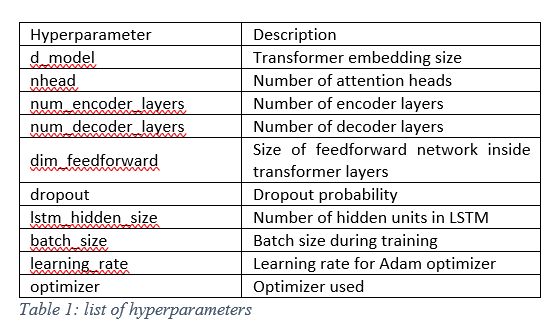

To find the best combination of model hyperparameters, a grid search using the Optuna framework was conducted. Different values for d_model, nhead, dropout, and lstm_hidden_size was explored. The model was trained for 10 epochs during each trial, and validation loss (Mean Squared Error) was used as the main selection criterion. In addition to the hybrid model, a standard Transformer Encoder-Decoder model without an LSTM layer was implemented as a baseline for comparison.
For The Encoder-Decoder-LSTM model the best values is in trial 3: d_model=64, Nhead=4, Dropout=0.4487, lstm_hidden_size=64, result in Val Loss=0.019299 and for the Encoder-LSTM-Decoder model The best values can be found in trail 8 : d_model=64, Nhead=8, Dropout=0.1339, lstm_hidden_size=128, result in Val Loss=0.025218.

The summarize of all the hyperparameters’ explored by greed search is list in table [2][3]


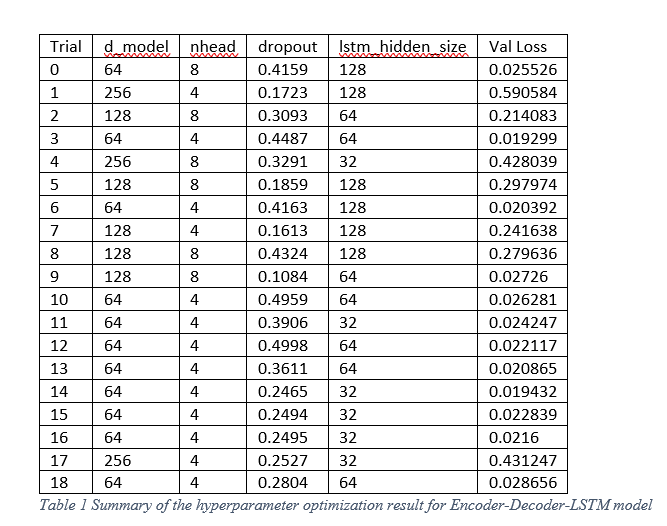

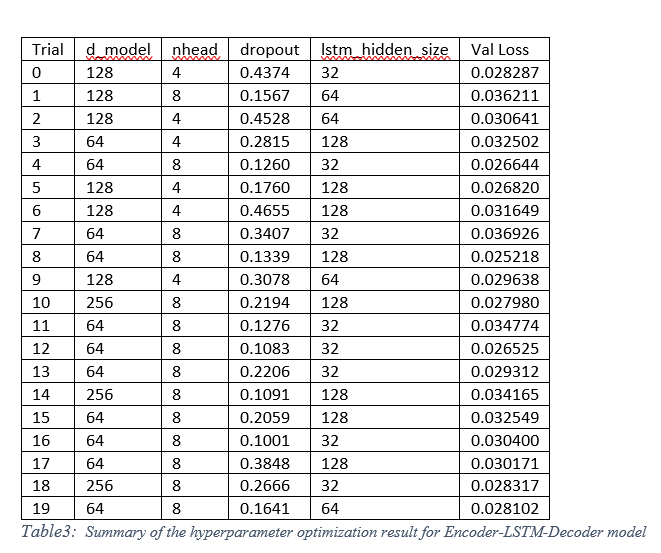





## **Experimental Results**
***Comparing the traning and validation loss***

The training and validation loss curves of the three models reveal important differences in stability and generalization. The Encoder LSTM Decoder model shows the most stable behavior, with both training and validation losses steadily decreasing over epochs and maintaining a low gap between them, indicating good generalization without overfitting. In contrast, the Encoder-Decoder model exhibits instability, particularly after epoch 70, where the validation loss spikes significantly, suggesting potential overfitting or issues such as an unsuitable learning rate or insufficient regularization. Meanwhile, the Encoder-Decoder LSTM model presents a generally decreasing trend for both training and validation losses, although the validation curve shows moderate fluctuations. While it is less stable than the first model, it still demonstrates acceptable generalization performance without major signs of instability. Overall, the Encoder LSTM Decoder shows the best among the three.

 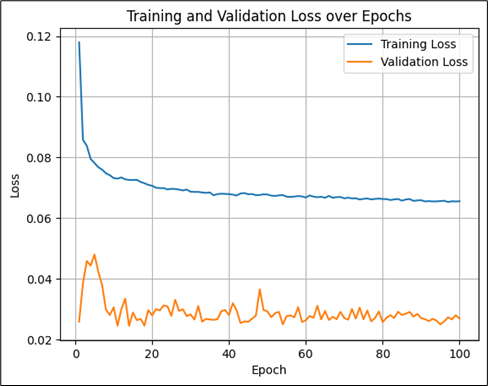

Table 1:Loss for Encoder LSTM decoder

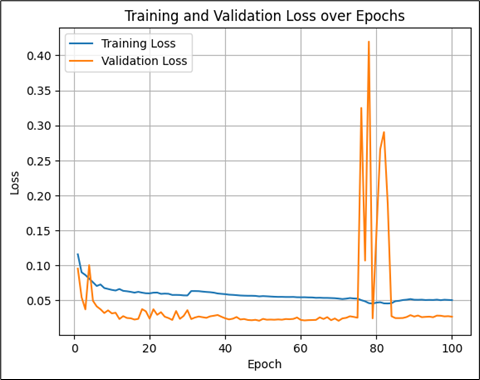

Table 2 Loss for Encoder decoder

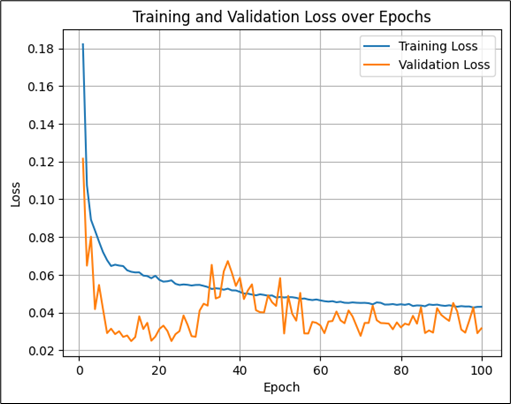

Table 3:Loss for Encoder decoder LSTM



***the Reust of excuting Inference Function on unseen data***

To evaluate the model performance accurately, the predicted values were first transformed back to the original scale by reversing the normalization. This is done because, evaluation metrics, including RMSE, Relative RMSE, and MAE, reflect the true magnitude of errors relative to the actual energy consumption values.
the Transformer Encoder-Decoder model was used as the baseline for evaluating performance improvements. The baseline model achieved an RMSE of 353.97, a Relative RMSE of 26.15%, and a MAE of 281.98. Compared to this baseline, the Encoder-Decoder LSTM model shows a significant improvement, reducing the RMSE to 253.96, the Relative RMSE to 18.76%, and the MAE to 199.16. This highlights the advantage of integrating LSTM after the Transformer decoder to better capture temporal patterns and enhance forecasting accuracy. However, the Encoder LSTM Decoder model performed worse than the baseline, resulting in a higher RMSE of 599.99, a Relative RMSE of 44.32%, and a MAE of 545.23. These findings can show that while combining Transformer encoding with LSTM decoding can even make worst the

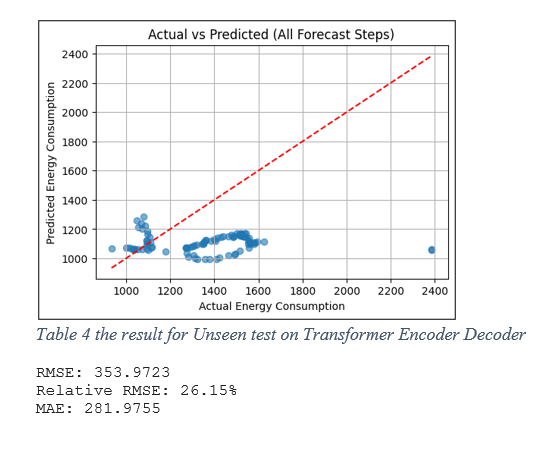


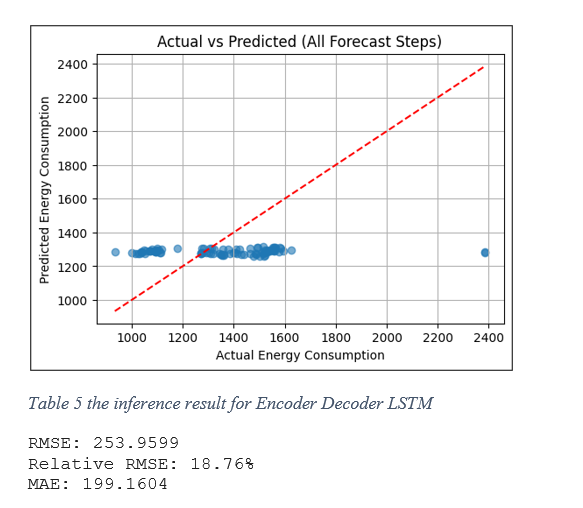


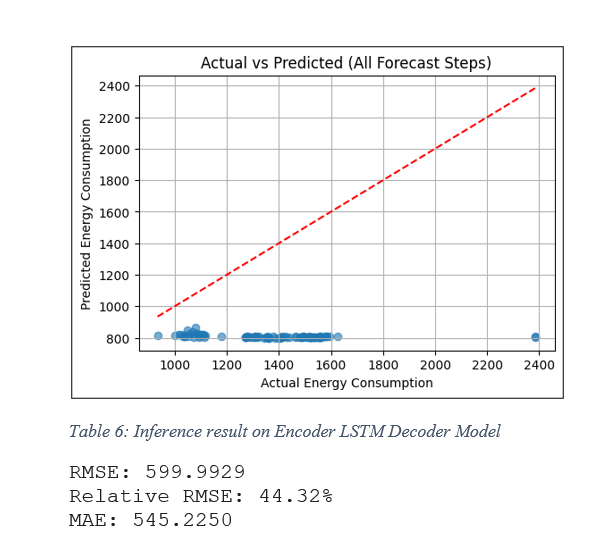




## **Conclusions**

Overall, the Encoder-Decoder LSTM model, which showed more reasonable decrease in the loss during the epochs for both training and validating, makes the beast result


## **References**

[1] H. Wang, Z. Hu, Z. Tian, Y. Chen, and Z. Fan, "Predicting Time Series Energy Consumption Based on Transformer and LSTM," Energies, vol. 17, no. 2, p. 457, Jan. 2024.

[2] Zhou, H., Zhang, S., Peng, J., Zhang, S., Li, J., Xiong, H., & Zhang, W. (2021).
Informer: Beyond Efficient Transformer for Long Sequence Time-Series Forecasting. AAAI 2021.
[3] Lab Section Code

# Installation
 Of optuma For greed search and Tensorbord for monitoring

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving best_encoderDecoder_model_wts1.pth to best_encoderDecoder_model_wts1.pth
Saving best_encoder_lstm_decoder_wts1.pth to best_encoder_lstm_decoder_wts1.pth
Saving best_encoder_lstm_decoder_wts.pth to best_encoder_lstm_decoder_wts.pth
Saving best_encoderDecoder_model_wts.pth to best_encoderDecoder_model_wts.pth
Saving best_model_encoder_decoder_lstm.pth to best_model_encoder_decoder_lstm.pth
Saving DASH_RAWDATA-01012022-31122022.xlsx to DASH_RAWDATA-01012022-31122022 (1).xlsx
Saving DASH_RAWDATA01012024-3122024.xlsx to DASH_RAWDATA01012024-3122024 (2).xlsx


In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 24.1 MB/s eta 0:00:00


In [ ]:
pip install tensorboard

In [ ]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, random_split, TensorDataset
import torch.nn as nn
import math
from torch.utils.data import DataLoader
import copy


# **Preprocessing**

In this Part,First, the raw data from the dataset is read. Then, input sequences of length L and output sequences of length pred_len are generated. And Finally the data is split into training, validation, and test sets, followed by normalization.# New Section

In [ ]:
def data_sequence_generation(Raw_Value, Date, L, pred_len):
    X_seq, X_date_seq, y_seq, y_date_seq = [], [], [], []

    for i in range(L, len(Raw_Value) - pred_len + 1):
        input_window = Raw_Value[i - L:i]
        target_window = Raw_Value[i:i + pred_len]

        date_input = Date[i - L:i]
        date_target = Date[i:i + pred_len]

        if not input_window.isna().any() and not target_window.isna().any():
            X_seq.append(input_window)
            y_seq.append(target_window)
            X_date_seq.append(date_input)
            y_date_seq.append(date_target)

    X_seq = np.array(X_seq)  # (N, L)
    y_seq = np.array(y_seq)  # (N, pred_len)

    return X_seq, y_seq, X_date_seq, y_date_seq


In [ ]:
from sklearn.preprocessing import StandardScaler

def get_data_loaders_bothNormalize(path, batch_size, L, pred_len):
    # Load and sort data
    df = pd.read_excel(path)
    df['Date'] = pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')
    df = df.dropna(subset=['Date', 'Raw Value']).sort_values(by='Date').reset_index(drop=True)

    raw_values = df['Raw Value']
    raw_dates = df['Date']

    # Generate sequences
    X_seq, y_seq, X_date_seq, y_data_seq = data_sequence_generation(raw_values, raw_dates, L, pred_len)

    # Ensure all arrays are the same length
    assert len(X_seq) == len(y_seq) == len(X_date_seq) == len(y_data_seq), "Sequence length mismatch"

    # Split before scaling
    total_size = len(X_seq)
    train_size = int(0.8 * total_size)

    X_train_np, X_val_np = X_seq[:train_size], X_seq[train_size:]
    y_train_np, y_val_np = y_seq[:train_size], y_seq[train_size:]
    X_date_val, y_date_val = X_date_seq[train_size:], y_data_seq[train_size:]

    # Normalize X
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train_np)
    X_val_scaled = scaler_x.transform(X_val_np)

    # Normalize y (each step across time)
    scaler_y = StandardScaler()
    y_train_scaled = scaler_y.fit_transform(y_train_np)  # shape: (N, D)
    y_val_scaled = scaler_y.transform(y_val_np)

    # Convert to torch tensors
    X_train = torch.tensor(X_train_scaled.reshape(-1, L, 1), dtype=torch.float32)
    y_train = torch.tensor(y_train_scaled, dtype=torch.float32)  # shape: [N, D]

    X_val = torch.tensor(X_val_scaled.reshape(-1, L, 1), dtype=torch.float32)
    y_val = torch.tensor(y_val_scaled, dtype=torch.float32)  # shape: [N, D]

    # Create datasets and loaders
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

    return train_loader, val_loader, X_date_val, y_date_val, scaler_x, scaler_y


# Preparing to write in tensorboard

In [ ]:
from torch.utils.tensorboard import SummaryWriter

# Create a writer to store logs in the "runs" directory
writer = SummaryWriter("/content/drive/MyDrive/Course/Deep/Project/runs/transformer_energy3")

In [ ]:
def log_batch_to_tensorboard(writer, epoch, batch_idx, batch_data, log_prefix="Batch_Info"):
    """
    Logs the datetime-aligned raw input and multi-step target sequence of each sample in a batch to TensorBoard.

    Parameters:
    ----------
    writer : SummaryWriter
        TensorBoard writer instance.
    epoch : int
        Current epoch number.
    batch_idx : int
        Current batch index.
    batch_data : list of tuples
        Each tuple: (input_dates, input_values, target_dates, target_values)
    log_prefix : str
        A tag prefix for TensorBoard.
    """

    for i, (input_dates, input_values, target_dates, target_values) in enumerate(batch_data):
        log_text = f"### Epoch: {epoch} | Batch: {batch_idx} | Sample: {i}\n\n"
        log_text += "**Input Sequence:**\n"
        log_text += "```\nDatetime\t\t\tValue\n"
        log_text += "\n".join(
            f"{str(d)[:19]}\t{v:.4f}" for d, v in zip(input_dates, input_values)
        )
        log_text += "\n```\n\n"

        log_text += "**Target Sequence:**\n"
        log_text += "```\nDatetime\t\t\tValue\n"
        log_text += "\n".join(
            f"{str(d)[:19]}\t{v:.4f}" for d, v in zip(target_dates, target_values)
        )
        log_text += "\n```"

        tag = f"{log_prefix}/Epoch_{epoch}/Batch_{batch_idx}/Sample_{i}"
        writer.add_text(tag, log_text, global_step=epoch * 1000 + batch_idx)


In [ ]:
def inspect_batch(batch_index, X_seq, y_seq, X_date_seq, y_date_seq, batch_size):
    """
    Inspects a specific batch and returns datetime-aligned raw input and target sequences.

    Parameters:
    -----------
    batch_index : int
        Index of the batch to inspect.
    X_seq : np.ndarray or torch.Tensor
        Input sequences, shape (N, L, 1).
    y_seq : np.ndarray or torch.Tensor
        Target sequences, shape (N, D).
    X_date_seq : list of list
        Datetime values for each input sequence.
    y_date_seq : list of list
        Datetime values for each output sequence.
    batch_size : int
        Batch size.

    Returns:
    --------
    batch_data : list of tuples
        Each tuple: (input_dates, input_values, output_dates, output_values)
    """

    start = batch_index * batch_size
    end = min((batch_index + 1) * batch_size, len(X_seq))

    batch_data = []

    for i in range(start, end):
        input_seq = X_seq[i].squeeze()
        if hasattr(input_seq, 'cpu'):
            input_seq = input_seq.cpu().numpy()

        target_seq = y_seq[i]
        if hasattr(target_seq, 'cpu'):
            target_seq = target_seq.cpu().numpy()

        input_dates = X_date_seq[i]
        target_dates = y_date_seq[i]

        batch_data.append((input_dates, input_seq, target_dates, target_seq))

    return batch_data


In [ ]:
def inspect_batch_Normalized(batch_index, X_seq, y_seq, X_date_seq, y_date_seq,
                  scaler_x, scaler_y, batch_size):
    """
    Inspects a specific batch and returns datetime-aligned *original* input and target sequences.

    Parameters:
    -----------
    batch_index : int
        Index of the batch to inspect.
    X_seq : np.ndarray or torch.Tensor
        Normalized input sequences, shape (N, L, 1).
    y_seq : np.ndarray or torch.Tensor
        Normalized target sequences, shape (N, D).
    X_date_seq : list of list
        Each item is a list of datetime values for each input sequence.
    y_date_seq : list of list
        Each item is a list of datetime values for each output sequence.
    scaler_x : StandardScaler
        Fitted scaler used for X values.
    scaler_y : StandardScaler
        Fitted scaler used for y values.
    batch_size : int
        Size of each batch.

    Returns:
    --------
    batch_data : list of tuples
        Each tuple: (input_dates, input_values, output_dates, output_values)
    """

    start = batch_index * batch_size
    end = min((batch_index + 1) * batch_size, len(X_seq))

    batch_data = []

    for i in range(start, end):
        # Input processing
        input_norm = X_seq[i].squeeze()
        if hasattr(input_norm, 'cpu'):
            input_norm = input_norm.cpu().numpy()

        input_orig = scaler_x.inverse_transform(input_norm.reshape(1, -1)).flatten()
        input_dates = X_date_seq[i]

        # Output processing (multi-step)
        target_norm = y_seq[i]
        if hasattr(target_norm, 'cpu'):
            target_norm = target_norm.cpu().numpy()

        target_orig = scaler_y.inverse_transform(target_norm.reshape(1, -1)).flatten()
        target_dates = y_date_seq[i]

        # Append full input-output data for this sample
        batch_data.append((input_dates, input_orig, target_dates, target_orig))

    return batch_data


In [ ]:
class Transformer_encoder(nn.Module):
    def __init__(self, input_size, d_model, nhead, num_encoder_layers,dim_feedforward,dropout):
        super(Transformer, self).__init__()

        self.input_proj = nn.Linear(input_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)

        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)
        self.fc_out = nn.Linear(d_model, 1)  # Predict next step value

    def forward(self, x):
        # x shape: [batch, seq_len, 1]
        x = self.input_proj(x)         # [batch, seq_len, d_model]
        x = self.pos_encoder(x)        # [batch, seq_len, d_model]
        Transformer_out = self.transformer_encoder(x)  # [batch, seq_len, d_model]
        out = self.fc_out(Transformer_out[:, -1, :])  # [batch, 1]
        return out.squeeze(-1)  # [batch]

In [ ]:
class Transformer(nn.Module):
    def __init__(self, input_size, d_model, nhead, num_encoder_layers, dim_feedforward, dropout, pred_len):
        super(Transformer, self).__init__()

        self.pred_len = pred_len
        self.input_proj = nn.Linear(input_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=True  # Important for [batch, seq_len, d_model]
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # Output layer: predict `pred_len` future values
        self.fc_out = nn.Linear(d_model, pred_len)

    def forward(self, x):
        # x: [batch, seq_len, 1]
        x = self.input_proj(x)             # [batch, seq_len, d_model]
        x = self.pos_encoder(x)            # Add positional encoding
        transformer_out = self.transformer_encoder(x)  # [batch, seq_len, d_model]
        out = self.fc_out(transformer_out[:, -1, :])    # [batch, pred_len]
        return out  # No squeeze — returns full sequence


# Requirments

In [ ]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super(PositionalEncoding, self).__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).unsqueeze(1).float()
        div_term = torch.exp(-math.log(10000.0) * (torch.arange(0, d_model, 2).float()) / d_model)
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)  # Shape: (1, max_len, d_model)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1), :]
        return x

#***TransformerEncoderLSTMDecoder***

In [ ]:
import torch
import torch.nn as nn

class TransformerEncoderLSTMDecoder(nn.Module):

    """
    Transformer Encoder + LSTM + Transformer Decoder model.

    This model uses:
    - A Transformer Encoder to extract long-term dependencies.
    - An LSTM layer to refine sequential memory from encoder outputs.
    - A Transformer Decoder to generate final predictions step-by-step.

    Args:
        input_size: Number of input features (hear is 1 as univariate energy value).
        d_model: Dimension of embeddings inside the transformer encoder.
        nhead : Number of attention heads.
        num_encoder_layers: Number of layers in the Transformer encoder.
        num_decoder_layers: Number of layers in the Transformer decoder.
        dim_feedforward: Size of the feedforward layers.
        dropout: Dropout rate.
        pred_len : Number of time steps to predict.
        lstm_hidden_siz : Hidden size for the LSTM layer.
    """
    def __init__(self, input_size, d_model, nhead, num_encoder_layers,
                 num_decoder_layers, dim_feedforward, dropout, pred_len, lstm_hidden_size):
        super(TransformerEncoderLSTMDecoder, self).__init__()

        self.pred_len = pred_len
        self.d_model = d_model
        self.lstm_hidden_size = lstm_hidden_size

        # Input projection layers
        self.input_proj = nn.Linear(input_size, d_model)
        self.output_proj = nn.Linear(1, d_model)  # For decoder input

        #Decoder input projection to match lstm_hidden_size. this is becuse the input of decoder comes from Lstm output
        self.decoder_input_proj = nn.Linear(d_model, lstm_hidden_size)

        # Positional encoding for encoder and decoder
        self.pos_encoder = PositionalEncoding(d_model)
        self.pos_decoder = PositionalEncoding(d_model)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=dim_feedforward, dropout=dropout,
            batch_first=True
        )
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # LSTM after Transformer Encoder
        self.lstm = nn.LSTM(
            input_size=d_model,
            hidden_size=lstm_hidden_size,
            num_layers=1,
            batch_first=True
        )

        # Transformer Decoder
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=lstm_hidden_size,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=True
        )
        self.decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_decoder_layers)

        # Final output layer
        self.fc_out = nn.Linear(lstm_hidden_size, 1)

    def forward(self, src, tgt):

        batch_size = src.size(0)

        # Project and encode the source
        src = self.input_proj(src)  # [batch, src_len, d_model]
        src = self.pos_encoder(src)

        # Project and encode the target
        tgt = self.output_proj(tgt)  # [batch, tgt_len, d_model]
        tgt = self.pos_decoder(tgt)

        # Project tgt(decoder input) to lstm_hidden_size
        tgt = self.decoder_input_proj(tgt)  # [batch, tgt_len, lstm_hidden_size]

        # Mask for decoder (causal)
        tgt_mask = generate_square_subsequent_mask(tgt.size(1)).to(tgt.device)

        # Transformer Encoder
        memory = self.encoder(src)  # [batch, src_len, d_model]

        # LSTM on Encoder output
        lstm_out, _ = self.lstm(memory)  # [batch, src_len, lstm_hidden_size]

        # Transformer Decoder (input: tgt, memory=lstm_out)
        output = self.decoder(tgt, lstm_out, tgt_mask=tgt_mask)  # [batch, tgt_len, lstm_hidden_size]

        # Final output projection
        output = self.fc_out(output)  # [batch, tgt_len, 1]

        return output.squeeze(-1)  # [batch, tgt_len]


In [ ]:
def training_encoder_lstm_decoder(model, train_loader, criterion, optimizer, device, pred_len):
    """
    Train Transformer Encoder + LSTM + Transformer Decoder model for one epoch.

    Args:
        model: Model instance.
        train_loader: DataLoader for training data.
        criterion: Loss function  (MSELoss).
        optimizer: Optimizer ( Adam).
        device: Device ('cuda' or 'cpu').
        pred_len: Output prediction sequence length.

    Returns:
        avg_train_loss: Average loss over training epoch.
    """

    model.train()
    model.to(device)
    total_loss = 0

    for X_batch, y_batch in train_loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)

        optimizer.zero_grad()

        batch_size = y_batch.size(0)

        # Prepare decoder input (teacher forcing)
        decoder_input = torch.zeros((batch_size, pred_len, 1), device=device)
        decoder_input[:, 1:, 0] = y_batch[:, :-1]
        decoder_input[:, 0, 0] = 0  # Start token

        preds = model(X_batch, decoder_input)  # [batch_size, pred_len]

        loss = criterion(preds, y_batch)

        loss.backward()

        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)

    return avg_train_loss


In [ ]:
def validating_encoder_lstm_decoder(model, val_loader, criterion, device, pred_len):
    """
    Validate Transformer Encoder + LSTM + Transformer Decoder model.

    Args:
        model: Model instance.
        val_loader: DataLoader for validation data.
        criterion: Loss function (MSELoss).
        device: Device ('cuda' or 'cpu').
        pred_len: Output prediction sequence length.

    Returns:
        avg_val_loss: Average validation loss.
        all_preds:   Concatenated predicted values.
        all_targets: Concatenated true target values.
    """

    model.eval()
    model.to(device)
    val_loss = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_val, y_val in val_loader:
            X_val = X_val.to(device)
            y_val = y_val.to(device)

            batch_size = y_val.size(0)

            # Prepare decoder input (teacher forcing)
            decoder_input = torch.zeros((batch_size, pred_len, 1), device=device)
            decoder_input[:, 1:, 0] = y_val[:, :-1]
            decoder_input[:, 0, 0] = 0  # Start token

            preds = model(X_val, decoder_input)

            loss = criterion(preds, y_val)
            val_loss += loss.item()

            all_preds.append(preds.cpu())
            all_targets.append(y_val.cpu())

    all_preds = torch.cat(all_preds, dim=0)
    all_targets = torch.cat(all_targets, dim=0)

    avg_val_loss = val_loss / len(val_loader)

    return avg_val_loss, all_preds, all_targets


In [ ]:
def run_epochs_encoder_lstm_decoder(model, train_loader, val_loader, num_epochs, lr, device, pred_len):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    criterion = nn.MSELoss()
    train_losses=[]
    val_losses=[]

    best_val_loss = float('inf')
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):
        train_loss = training_encoder_lstm_decoder(model, train_loader, criterion, optimizer, device, pred_len)
        val_loss, preds, targets = validating_encoder_lstm_decoder(model, val_loader, criterion, device, pred_len)

        val_losses.append(val_loss)
        train_losses.append(train_loss)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_encoder_lstm_decoder_wts = copy.deepcopy(model.state_dict())

    print(f"\nBest Val Loss: {best_val_loss:.4f}")
    #model.load_state_dict(best_model_wts)
    PATH = "best_encoder_lstm_decoder_wts.pth"
    torch.save(best_encoder_lstm_decoder_wts, PATH)

    writer.add_scalar("Best Val Loss", best_val_loss, epoch)
    # Plot losses
    plt.figure()
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()
    writer.close()

    return model


In [ ]:
def train_model_gridsearch(model, train_loader, val_loader, optimizer, criterion, device, num_epochs, pred_len):
    """
    Train and validate TransformerEncoderLSTMDecoder model for hyperparameter search.

    Args:
        model: The model to train.
        train_loader: DataLoader for training data.
        val_loader: DataLoader for validation data.
        optimizer: Optimizer (Adam).
        criterion: Loss function (MSELoss).
        device: Device to train on ('cuda' or 'cpu').
        num_epochs: Number of training epochs.
        pred_len: Prediction length (target sequence length).

    Returns:
        train_losses (list): Training losses over epochs.
        val_losses (list): Validation losses over epochs.
    """

    model.to(device)
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        total_train_loss = 0
        model.train()

        for X_batch, y_batch in train_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            optimizer.zero_grad()

            batch_size = y_batch.size(0)

            # Prepare decoder input (teacher forcing)
            decoder_input = torch.zeros((batch_size, pred_len), device=device)
            decoder_input[:, 1:] = y_batch[:, :-1]
            decoder_input[:, 0] = 0  # Start token

           # Unsqueeze to [batch_size, pred_len, 1]
            decoder_input = decoder_input.unsqueeze(-1)

            preds = model(X_batch, decoder_input)  # [batch_size, pred_len]

            loss = criterion(preds, y_batch)

            loss.backward()

            # Gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()

            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # --- Validation after each epoch ---
        model.eval()
        total_val_loss = 0

        with torch.no_grad():
            for X_val, y_val in val_loader:
                X_val = X_val.to(device)
                y_val = y_val.to(device)

                batch_size = y_val.size(0)

                # Prepare decoder input (teacher forcing)
                decoder_input = torch.zeros((batch_size, pred_len), device=device)
                decoder_input[:, 1:] = y_val[:, :-1]
                decoder_input[:, 0] = 0  # Start token

                decoder_input = decoder_input.unsqueeze(-1)

                preds = model(X_val, decoder_input)

                loss = criterion(preds, y_val)
                total_val_loss += loss.item()

        avg_val_loss = total_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch [{epoch+1}/{num_epochs}] | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")

    return train_losses, val_losses


In [ ]:
import optuna

def objective(trial):
    # hyperparameters
    d_model = trial.suggest_categorical('d_model', [64, 128, 256])
    nhead = trial.suggest_categorical('nhead', [4, 8])
    dropout = trial.suggest_float('dropout', 0.1, 0.5)
    lstm_hidden_size = trial.suggest_categorical('lstm_hidden_size', [32, 64, 128])

    # Initialize model with hyperparameter values
    model = TransformerEncoderLSTMDecoder(
        input_size=1,
        d_model=d_model,
        nhead=nhead,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=512,
        dropout=dropout,
        pred_len=96,
        lstm_hidden_size=lstm_hidden_size
    ).to(device)


    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    loss_fn = nn.MSELoss()

    # Train the model for 10 epochs for tuning
    train_losses, val_losses = train_model_gridsearch(
        model, train_loader, val_loader,
        optimizer, loss_fn, device,
        num_epochs=10,
        pred_len=96
    )

    # Return best validation loss to minimize
    return min(val_losses)


study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20)

# Print best hyperparameters
print(study.best_params)


[I 2025-04-27 16:26:45,732] A new study created in memory with name: no-name-1a869d97-bcda-4de4-9db4-803f5225ce11


Epoch [1/10] | Train Loss: 0.108765 | Val Loss: 0.029024
Epoch [2/10] | Train Loss: 0.083503 | Val Loss: 0.033910
Epoch [3/10] | Train Loss: 0.079252 | Val Loss: 0.028287
Epoch [4/10] | Train Loss: 0.078223 | Val Loss: 0.028604
Epoch [5/10] | Train Loss: 0.077013 | Val Loss: 0.031527
Epoch [6/10] | Train Loss: 0.075913 | Val Loss: 0.033302
Epoch [7/10] | Train Loss: 0.075853 | Val Loss: 0.033567
Epoch [8/10] | Train Loss: 0.075341 | Val Loss: 0.035969
Epoch [9/10] | Train Loss: 0.073543 | Val Loss: 0.034128


[I 2025-04-27 16:31:04,342] Trial 0 finished with value: 0.028286807018137256 and parameters: {'d_model': 128, 'nhead': 4, 'dropout': 0.43737439327730876, 'lstm_hidden_size': 32}. Best is trial 0 with value: 0.028286807018137256.


Epoch [10/10] | Train Loss: 0.074312 | Val Loss: 0.030932
Epoch [1/10] | Train Loss: 0.114872 | Val Loss: 0.059192
Epoch [2/10] | Train Loss: 0.085819 | Val Loss: 0.040542
Epoch [3/10] | Train Loss: 0.082468 | Val Loss: 0.036211
Epoch [4/10] | Train Loss: 0.078771 | Val Loss: 0.039940
Epoch [5/10] | Train Loss: 0.077200 | Val Loss: 0.039385
Epoch [6/10] | Train Loss: 0.075673 | Val Loss: 0.045233
Epoch [7/10] | Train Loss: 0.074361 | Val Loss: 0.042893
Epoch [8/10] | Train Loss: 0.074505 | Val Loss: 0.042784
Epoch [9/10] | Train Loss: 0.073609 | Val Loss: 0.041669


[I 2025-04-27 16:35:40,305] Trial 1 finished with value: 0.03621052712375342 and parameters: {'d_model': 128, 'nhead': 8, 'dropout': 0.15667049371142522, 'lstm_hidden_size': 64}. Best is trial 0 with value: 0.028286807018137256.


Epoch [10/10] | Train Loss: 0.072863 | Val Loss: 0.039088
Epoch [1/10] | Train Loss: 0.107975 | Val Loss: 0.049498
Epoch [2/10] | Train Loss: 0.084529 | Val Loss: 0.049737
Epoch [3/10] | Train Loss: 0.081778 | Val Loss: 0.039032
Epoch [4/10] | Train Loss: 0.079461 | Val Loss: 0.031348
Epoch [5/10] | Train Loss: 0.078477 | Val Loss: 0.031251
Epoch [6/10] | Train Loss: 0.076897 | Val Loss: 0.034145
Epoch [7/10] | Train Loss: 0.076138 | Val Loss: 0.030923
Epoch [8/10] | Train Loss: 0.075962 | Val Loss: 0.030947
Epoch [9/10] | Train Loss: 0.074662 | Val Loss: 0.032297


[I 2025-04-27 16:39:31,369] Trial 2 finished with value: 0.03064124926838071 and parameters: {'d_model': 128, 'nhead': 4, 'dropout': 0.45277529878919354, 'lstm_hidden_size': 64}. Best is trial 0 with value: 0.028286807018137256.


Epoch [10/10] | Train Loss: 0.074235 | Val Loss: 0.030641
Epoch [1/10] | Train Loss: 0.122144 | Val Loss: 0.032502
Epoch [2/10] | Train Loss: 0.082556 | Val Loss: 0.043147
Epoch [3/10] | Train Loss: 0.080388 | Val Loss: 0.034705
Epoch [4/10] | Train Loss: 0.080941 | Val Loss: 0.064800
Epoch [5/10] | Train Loss: 0.079283 | Val Loss: 0.050911
Epoch [6/10] | Train Loss: 0.077698 | Val Loss: 0.055360
Epoch [7/10] | Train Loss: 0.076635 | Val Loss: 0.033467
Epoch [8/10] | Train Loss: 0.075169 | Val Loss: 0.045845
Epoch [9/10] | Train Loss: 0.074891 | Val Loss: 0.042746


[I 2025-04-27 16:43:27,097] Trial 3 finished with value: 0.03250220504177864 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.2815469554725005, 'lstm_hidden_size': 128}. Best is trial 0 with value: 0.028286807018137256.


Epoch [10/10] | Train Loss: 0.073179 | Val Loss: 0.035351
Epoch [1/10] | Train Loss: 0.122290 | Val Loss: 0.036185
Epoch [2/10] | Train Loss: 0.089622 | Val Loss: 0.034257
Epoch [3/10] | Train Loss: 0.081932 | Val Loss: 0.037852
Epoch [4/10] | Train Loss: 0.079583 | Val Loss: 0.028202
Epoch [5/10] | Train Loss: 0.077077 | Val Loss: 0.026644
Epoch [6/10] | Train Loss: 0.075344 | Val Loss: 0.031116
Epoch [7/10] | Train Loss: 0.074699 | Val Loss: 0.029734
Epoch [8/10] | Train Loss: 0.073940 | Val Loss: 0.029966
Epoch [9/10] | Train Loss: 0.073186 | Val Loss: 0.044262


[I 2025-04-27 16:47:15,083] Trial 4 finished with value: 0.026643670954589926 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.125969743913249, 'lstm_hidden_size': 32}. Best is trial 4 with value: 0.026643670954589926.


Epoch [10/10] | Train Loss: 0.073968 | Val Loss: 0.033138
Epoch [1/10] | Train Loss: 0.152657 | Val Loss: 0.028637
Epoch [2/10] | Train Loss: 0.084602 | Val Loss: 0.026820
Epoch [3/10] | Train Loss: 0.084157 | Val Loss: 0.039136
Epoch [4/10] | Train Loss: 0.082546 | Val Loss: 0.040975
Epoch [5/10] | Train Loss: 0.079887 | Val Loss: 0.066594
Epoch [6/10] | Train Loss: 0.077651 | Val Loss: 0.065107
Epoch [7/10] | Train Loss: 0.077990 | Val Loss: 0.085516
Epoch [8/10] | Train Loss: 0.077517 | Val Loss: 0.054640
Epoch [9/10] | Train Loss: 0.075838 | Val Loss: 0.041955


[I 2025-04-27 16:51:27,495] Trial 5 finished with value: 0.026819541890087516 and parameters: {'d_model': 128, 'nhead': 4, 'dropout': 0.17597817470244329, 'lstm_hidden_size': 128}. Best is trial 4 with value: 0.026643670954589926.


Epoch [10/10] | Train Loss: 0.074227 | Val Loss: 0.041490
Epoch [1/10] | Train Loss: 0.196723 | Val Loss: 0.038565
Epoch [2/10] | Train Loss: 0.099558 | Val Loss: 0.031649
Epoch [3/10] | Train Loss: 0.092121 | Val Loss: 0.040732
Epoch [4/10] | Train Loss: 0.085857 | Val Loss: 0.039140
Epoch [5/10] | Train Loss: 0.087589 | Val Loss: 0.042930
Epoch [6/10] | Train Loss: 0.086747 | Val Loss: 0.057688
Epoch [7/10] | Train Loss: 0.082961 | Val Loss: 0.058012
Epoch [8/10] | Train Loss: 0.080331 | Val Loss: 0.050348
Epoch [9/10] | Train Loss: 0.080362 | Val Loss: 0.054302


[I 2025-04-27 16:55:39,381] Trial 6 finished with value: 0.031648915793833346 and parameters: {'d_model': 128, 'nhead': 4, 'dropout': 0.4654544991894637, 'lstm_hidden_size': 128}. Best is trial 4 with value: 0.026643670954589926.


Epoch [10/10] | Train Loss: 0.079740 | Val Loss: 0.050081
Epoch [1/10] | Train Loss: 0.128435 | Val Loss: 0.037437
Epoch [2/10] | Train Loss: 0.088541 | Val Loss: 0.039998
Epoch [3/10] | Train Loss: 0.080582 | Val Loss: 0.044671
Epoch [4/10] | Train Loss: 0.077260 | Val Loss: 0.038905
Epoch [5/10] | Train Loss: 0.076089 | Val Loss: 0.040424
Epoch [6/10] | Train Loss: 0.074961 | Val Loss: 0.042487
Epoch [7/10] | Train Loss: 0.075120 | Val Loss: 0.051930
Epoch [8/10] | Train Loss: 0.074618 | Val Loss: 0.036926
Epoch [9/10] | Train Loss: 0.075638 | Val Loss: 0.039469


[I 2025-04-27 16:59:33,396] Trial 7 finished with value: 0.03692585131326734 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.3407155022487014, 'lstm_hidden_size': 32}. Best is trial 4 with value: 0.026643670954589926.


Epoch [10/10] | Train Loss: 0.074359 | Val Loss: 0.038440
Epoch [1/10] | Train Loss: 0.165964 | Val Loss: 0.025876
Epoch [2/10] | Train Loss: 0.094779 | Val Loss: 0.025218
Epoch [3/10] | Train Loss: 0.090026 | Val Loss: 0.029431
Epoch [4/10] | Train Loss: 0.083307 | Val Loss: 0.030632
Epoch [5/10] | Train Loss: 0.083790 | Val Loss: 0.030471
Epoch [6/10] | Train Loss: 0.080255 | Val Loss: 0.039519
Epoch [7/10] | Train Loss: 0.079482 | Val Loss: 0.039528
Epoch [8/10] | Train Loss: 0.078020 | Val Loss: 0.043889
Epoch [9/10] | Train Loss: 0.077780 | Val Loss: 0.033061


[I 2025-04-27 17:03:50,698] Trial 8 finished with value: 0.0252180662699217 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.13392448544150393, 'lstm_hidden_size': 128}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.076179 | Val Loss: 0.040209
Epoch [1/10] | Train Loss: 0.118856 | Val Loss: 0.035484
Epoch [2/10] | Train Loss: 0.085832 | Val Loss: 0.040234
Epoch [3/10] | Train Loss: 0.081560 | Val Loss: 0.029638
Epoch [4/10] | Train Loss: 0.080534 | Val Loss: 0.039058
Epoch [5/10] | Train Loss: 0.077538 | Val Loss: 0.031354
Epoch [6/10] | Train Loss: 0.075836 | Val Loss: 0.040125
Epoch [7/10] | Train Loss: 0.075707 | Val Loss: 0.039772
Epoch [8/10] | Train Loss: 0.074978 | Val Loss: 0.040712
Epoch [9/10] | Train Loss: 0.074524 | Val Loss: 0.036550


[I 2025-04-27 17:07:41,587] Trial 9 finished with value: 0.029637748548804327 and parameters: {'d_model': 128, 'nhead': 4, 'dropout': 0.3077560876182277, 'lstm_hidden_size': 64}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.073815 | Val Loss: 0.034184
Epoch [1/10] | Train Loss: 0.155351 | Val Loss: 0.027980
Epoch [2/10] | Train Loss: 0.086876 | Val Loss: 0.046695
Epoch [3/10] | Train Loss: 0.082894 | Val Loss: 0.034422
Epoch [4/10] | Train Loss: 0.078941 | Val Loss: 0.044233
Epoch [5/10] | Train Loss: 0.076694 | Val Loss: 0.032820
Epoch [6/10] | Train Loss: 0.075975 | Val Loss: 0.033527
Epoch [7/10] | Train Loss: 0.075188 | Val Loss: 0.037020
Epoch [8/10] | Train Loss: 0.074129 | Val Loss: 0.037610
Epoch [9/10] | Train Loss: 0.073657 | Val Loss: 0.029376


[I 2025-04-27 17:13:30,112] Trial 10 finished with value: 0.027979933158602824 and parameters: {'d_model': 256, 'nhead': 8, 'dropout': 0.21937681732239928, 'lstm_hidden_size': 128}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.073665 | Val Loss: 0.035282
Epoch [1/10] | Train Loss: 0.118009 | Val Loss: 0.036468
Epoch [2/10] | Train Loss: 0.085762 | Val Loss: 0.036042
Epoch [3/10] | Train Loss: 0.079694 | Val Loss: 0.034774
Epoch [4/10] | Train Loss: 0.077723 | Val Loss: 0.037599
Epoch [5/10] | Train Loss: 0.075605 | Val Loss: 0.040542
Epoch [6/10] | Train Loss: 0.074166 | Val Loss: 0.041748
Epoch [7/10] | Train Loss: 0.074222 | Val Loss: 0.043102
Epoch [8/10] | Train Loss: 0.073264 | Val Loss: 0.039747
Epoch [9/10] | Train Loss: 0.073379 | Val Loss: 0.035428


[I 2025-04-27 17:17:18,798] Trial 11 finished with value: 0.0347738484657088 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.12755901309316275, 'lstm_hidden_size': 32}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.072799 | Val Loss: 0.046794
Epoch [1/10] | Train Loss: 0.123244 | Val Loss: 0.032176
Epoch [2/10] | Train Loss: 0.089985 | Val Loss: 0.071375
Epoch [3/10] | Train Loss: 0.086377 | Val Loss: 0.031496
Epoch [4/10] | Train Loss: 0.077894 | Val Loss: 0.030005
Epoch [5/10] | Train Loss: 0.077953 | Val Loss: 0.030223
Epoch [6/10] | Train Loss: 0.075077 | Val Loss: 0.033273
Epoch [7/10] | Train Loss: 0.074422 | Val Loss: 0.040896
Epoch [8/10] | Train Loss: 0.074009 | Val Loss: 0.026936
Epoch [9/10] | Train Loss: 0.072040 | Val Loss: 0.031692


[I 2025-04-27 17:21:09,525] Trial 12 finished with value: 0.026524699449019376 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.10829229946220206, 'lstm_hidden_size': 32}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.071854 | Val Loss: 0.026525
Epoch [1/10] | Train Loss: 0.116822 | Val Loss: 0.033295
Epoch [2/10] | Train Loss: 0.087950 | Val Loss: 0.042708
Epoch [3/10] | Train Loss: 0.084086 | Val Loss: 0.047102
Epoch [4/10] | Train Loss: 0.080118 | Val Loss: 0.031405
Epoch [5/10] | Train Loss: 0.078511 | Val Loss: 0.040277
Epoch [6/10] | Train Loss: 0.075659 | Val Loss: 0.042802
Epoch [7/10] | Train Loss: 0.075173 | Val Loss: 0.038706
Epoch [8/10] | Train Loss: 0.073867 | Val Loss: 0.031072
Epoch [9/10] | Train Loss: 0.073430 | Val Loss: 0.030776


[I 2025-04-27 17:24:55,774] Trial 13 finished with value: 0.02931163283281548 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.2206360332903265, 'lstm_hidden_size': 32}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.073417 | Val Loss: 0.029312
Epoch [1/10] | Train Loss: 0.153016 | Val Loss: 0.037766
Epoch [2/10] | Train Loss: 0.087534 | Val Loss: 0.036536
Epoch [3/10] | Train Loss: 0.084992 | Val Loss: 0.062319
Epoch [4/10] | Train Loss: 0.079924 | Val Loss: 0.058510
Epoch [5/10] | Train Loss: 0.077323 | Val Loss: 0.046346
Epoch [6/10] | Train Loss: 0.076295 | Val Loss: 0.038191
Epoch [7/10] | Train Loss: 0.075640 | Val Loss: 0.036871
Epoch [8/10] | Train Loss: 0.074843 | Val Loss: 0.034165
Epoch [9/10] | Train Loss: 0.073855 | Val Loss: 0.040802


[I 2025-04-27 17:30:43,571] Trial 14 finished with value: 0.034164939517545144 and parameters: {'d_model': 256, 'nhead': 8, 'dropout': 0.10912205540506634, 'lstm_hidden_size': 128}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.074429 | Val Loss: 0.035287
Epoch [1/10] | Train Loss: 0.124426 | Val Loss: 0.034390
Epoch [2/10] | Train Loss: 0.084331 | Val Loss: 0.056573
Epoch [3/10] | Train Loss: 0.085715 | Val Loss: 0.037704
Epoch [4/10] | Train Loss: 0.081545 | Val Loss: 0.040901
Epoch [5/10] | Train Loss: 0.079365 | Val Loss: 0.060275
Epoch [6/10] | Train Loss: 0.078534 | Val Loss: 0.043255
Epoch [7/10] | Train Loss: 0.077829 | Val Loss: 0.059336
Epoch [8/10] | Train Loss: 0.076888 | Val Loss: 0.032549
Epoch [9/10] | Train Loss: 0.075297 | Val Loss: 0.035070


[I 2025-04-27 17:35:01,416] Trial 15 finished with value: 0.03254872963568845 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.2059307026798455, 'lstm_hidden_size': 128}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.074845 | Val Loss: 0.033707
Epoch [1/10] | Train Loss: 0.116725 | Val Loss: 0.030400
Epoch [2/10] | Train Loss: 0.087423 | Val Loss: 0.039740
Epoch [3/10] | Train Loss: 0.079881 | Val Loss: 0.048590
Epoch [4/10] | Train Loss: 0.075483 | Val Loss: 0.045051
Epoch [5/10] | Train Loss: 0.074847 | Val Loss: 0.037208
Epoch [6/10] | Train Loss: 0.074002 | Val Loss: 0.039371
Epoch [7/10] | Train Loss: 0.073107 | Val Loss: 0.046467
Epoch [8/10] | Train Loss: 0.072980 | Val Loss: 0.039851
Epoch [9/10] | Train Loss: 0.071800 | Val Loss: 0.040282


[I 2025-04-27 17:38:47,745] Trial 16 finished with value: 0.03040041622684099 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.10007957526536329, 'lstm_hidden_size': 32}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.071644 | Val Loss: 0.037760
Epoch [1/10] | Train Loss: 0.122591 | Val Loss: 0.030171
Epoch [2/10] | Train Loss: 0.087068 | Val Loss: 0.033092
Epoch [3/10] | Train Loss: 0.086039 | Val Loss: 0.066154
Epoch [4/10] | Train Loss: 0.083666 | Val Loss: 0.034561
Epoch [5/10] | Train Loss: 0.082254 | Val Loss: 0.036415
Epoch [6/10] | Train Loss: 0.079507 | Val Loss: 0.038826
Epoch [7/10] | Train Loss: 0.077611 | Val Loss: 0.038996
Epoch [8/10] | Train Loss: 0.077684 | Val Loss: 0.042549
Epoch [9/10] | Train Loss: 0.075815 | Val Loss: 0.040497


[I 2025-04-27 17:43:05,566] Trial 17 finished with value: 0.030170651568576345 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.3847618040151086, 'lstm_hidden_size': 128}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.076198 | Val Loss: 0.037068
Epoch [1/10] | Train Loss: 0.123210 | Val Loss: 0.028317
Epoch [2/10] | Train Loss: 0.087126 | Val Loss: 0.037623
Epoch [3/10] | Train Loss: 0.080509 | Val Loss: 0.035894
Epoch [4/10] | Train Loss: 0.078099 | Val Loss: 0.038545
Epoch [5/10] | Train Loss: 0.075659 | Val Loss: 0.035950
Epoch [6/10] | Train Loss: 0.074441 | Val Loss: 0.034775
Epoch [7/10] | Train Loss: 0.075030 | Val Loss: 0.034426
Epoch [8/10] | Train Loss: 0.073423 | Val Loss: 0.033130
Epoch [9/10] | Train Loss: 0.073083 | Val Loss: 0.036306


[I 2025-04-27 17:47:59,902] Trial 18 finished with value: 0.02831659825345458 and parameters: {'d_model': 256, 'nhead': 8, 'dropout': 0.2666249578937938, 'lstm_hidden_size': 32}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.073920 | Val Loss: 0.033655
Epoch [1/10] | Train Loss: 0.126858 | Val Loss: 0.028102
Epoch [2/10] | Train Loss: 0.092654 | Val Loss: 0.035060
Epoch [3/10] | Train Loss: 0.083976 | Val Loss: 0.028950
Epoch [4/10] | Train Loss: 0.080797 | Val Loss: 0.037925
Epoch [5/10] | Train Loss: 0.079157 | Val Loss: 0.056885
Epoch [6/10] | Train Loss: 0.077586 | Val Loss: 0.050613
Epoch [7/10] | Train Loss: 0.074883 | Val Loss: 0.056424
Epoch [8/10] | Train Loss: 0.074608 | Val Loss: 0.049998
Epoch [9/10] | Train Loss: 0.073435 | Val Loss: 0.060065


[I 2025-04-27 17:51:49,472] Trial 19 finished with value: 0.02810195566176675 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.1640923737214037, 'lstm_hidden_size': 64}. Best is trial 8 with value: 0.0252180662699217.


Epoch [10/10] | Train Loss: 0.073486 | Val Loss: 0.039158
{'d_model': 64, 'nhead': 8, 'dropout': 0.13392448544150393, 'lstm_hidden_size': 128}


In [ ]:
def inference_encoder_lstm_decoderold(model, input_sequence, pred_len, device):
    """
    Inference with Transformer Encoder + LSTM + Transformer Decoder (autoregressive decoding).

    Args:
        model: Trained model instance.
        input_sequence:  representing the input sequence.
        pred_len: Number of future steps to predict.
        device: Device ('cuda' or 'cpu').

    Returns:
        predictions: Tensor of shape [1, pred_len].
    """

    model.eval()
    model.to(device)
    input_sequence = input_sequence.to(device)

    with torch.no_grad():
        # Prepare encoder input
        src = input_sequence  # [1, src_len, 1]

        # No decoder input yet (we start with zeros)
        decoder_input = torch.zeros((1, 1, model.d_model), device=device)  # Start with start token (0)

        # Project encoder input
        src_proj = model.input_proj(src)
        src_proj = model.pos_encoder(src_proj)

        # Encode
        memory = model.encoder(src_proj)

        # LSTM on encoder memory
        lstm_out, _ = model.lstm(memory)

        preds = []

        for step in range(pred_len):
            # Project decoder input
            tgt_proj = model.output_proj(decoder_input)
            tgt_proj = model.pos_decoder(tgt_proj)

            # Create mask (causal mask for decoder self-attention)
            tgt_mask = generate_square_subsequent_mask(tgt_proj.size(1)).to(device)

            # Decode
            output = model.decoder(tgt_proj, lstm_out, tgt_mask=tgt_mask)  # [1, seq_len, lstm_hidden_size]

            # Project to prediction
            pred = model.fc_out(output)  # [1, seq_len, 1]

            # Take the last prediction
            next_value = pred[:, -1, :]  # [1, 1]

            # Save prediction
            preds.append(next_value)

            # Append this predicted value to decoder_input for next step
            decoder_input = torch.cat([decoder_input, next_value.unsqueeze(1)], dim=1)

        # After the loop, concatenate all predicted steps
        preds = torch.cat(preds, dim=1)  # [1, pred_len]

    return preds.squeeze(0)  # [pred_len]


In [ ]:
def inference_encoder_lstm_decoder(model, input_sequence, pred_len, device):
    """
    Inference with Transformer Encoder + LSTM + Transformer Decoder.

    Args:
        model: Trained model instance.
        input_sequence: Tensor representing the input sequence. Shape: [batch=1, src_len, input_size=1].
        pred_len: Number of future steps to predict.
        device: Device ('cuda' or 'cpu').

    Returns:
        predictions: Tensor of shape [pred_len].
    """

    model.eval()
    model.to(device)
    input_sequence = input_sequence.to(device)

    with torch.no_grad():
        # Project and encode the source input
        src_proj = model.input_proj(input_sequence)     # [1, src_len, d_model]
        src_proj = model.pos_encoder(src_proj)
        memory = model.encoder(src_proj)                # [1, src_len, d_model]

        # LSTM on encoder output
        lstm_out, _ = model.lstm(memory)                # [1, src_len, lstm_hidden_size]

        # Prepare empty decoder input
        decoder_input = torch.zeros((1, pred_len, 1), device=device)  # [batch=1, pred_len, 1]
        decoder_input[:, 0, 0] = 0  # Start token

        predictions = []

        for t in range(pred_len):
            # Pass current decoder input through model
            preds = model(input_sequence, decoder_input)   # [1, pred_len]

            # Get prediction at current time step
            next_pred = preds[:, t]  # [1] → predicted value at step t

            # Save prediction
            predictions.append(next_pred.unsqueeze(1))  # [1, 1]

            # Insert prediction into decoder input for next step
            if t + 1 < pred_len:
                decoder_input[:, t + 1, 0] = next_pred  # Fill the next decoder input step

        # After loop, concatenate predictions
        predictions = torch.cat(predictions, dim=1)  # [1, pred_len]

    return predictions.squeeze(0)  # [pred_len]


Predicted: tensor([-1.2313, -1.2794, -1.3119, -1.3297, -1.3408, -1.3475, -1.3512, -1.3532,
        -1.3543, -1.3555, -1.3572, -1.3590, -1.3608, -1.3632, -1.3666, -1.3711,
        -1.3758, -1.3795, -1.3811, -1.3809, -1.3799, -1.3798, -1.3817, -1.3842,
        -1.3859, -1.3868, -1.3860, -1.3842, -1.3836, -1.3856, -1.3885, -1.3905,
        -1.3913, -1.3908, -1.3894, -1.3879, -1.3870, -1.3866, -1.3866, -1.3878,
        -1.3905, -1.3932, -1.3941, -1.3935, -1.3921, -1.3904, -1.3900, -1.3910,
        -1.3937, -1.3969, -1.3987, -1.3988, -1.3984, -1.3983, -1.4000, -1.4016,
        -1.4022, -1.4029, -1.4033, -1.4036, -1.4036, -1.4036, -1.4038, -1.4043,
        -1.4053, -1.4065, -1.4079, -1.4088, -1.4084, -1.4066, -1.4047, -1.4038,
        -1.4040, -1.4059, -1.4054, -1.4044, -1.4034, -1.3998, -1.3973, -1.3958,
        -1.3956, -1.3963, -1.3957, -1.3949, -1.3940, -1.3922, -1.3905, -1.3890,
        -1.3853, -1.3803, -1.3760, -1.3721, -1.3689, -1.3651, -1.3585, -1.3513],
       device='cuda:0')
True

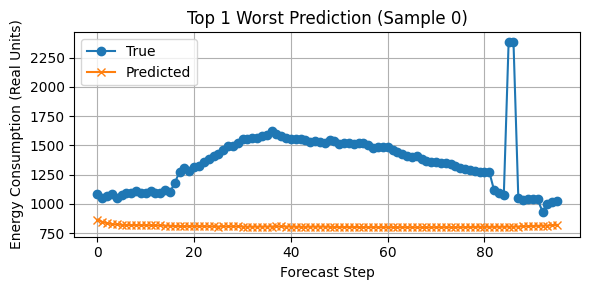

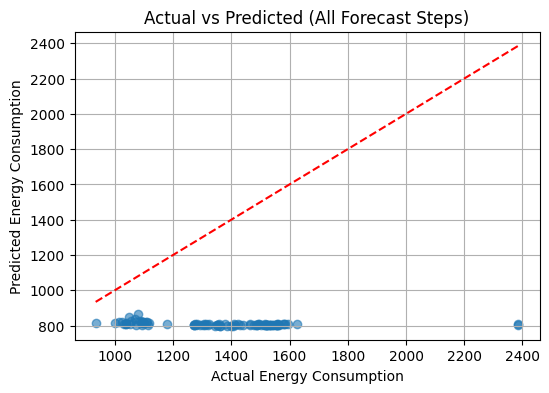

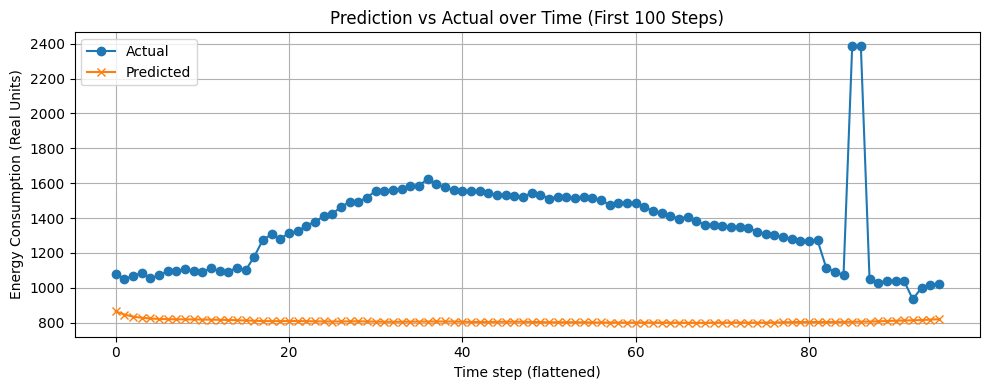

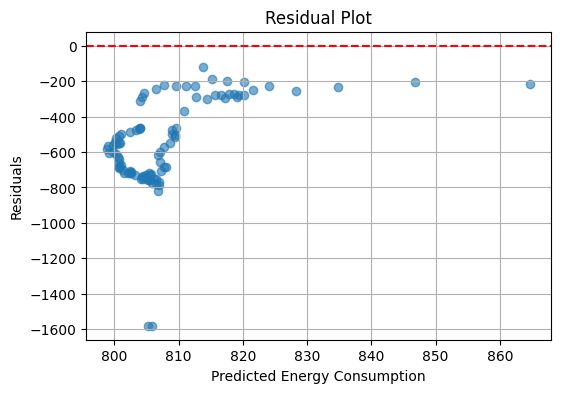

In [ ]:
    device = torch.device("cuda" )
    L = 96  # sequence length
    pred_len=96
    lr= 0.001
    num_epochs=100
    batch_size=32
    train_loader, val_loader,X_date_seq, y_data_seq, scaler_x, scaler_y  = get_data_loaders_bothNormalize('DASH_RAWDATA-01012022-31122022.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)
    test_loader = val_loader
    for X_batch, y_batch in test_loader:
        input_sequence = X_batch[0].unsqueeze(0)  # [1, src_len, 1]
        target_sequence = y_batch[0]  # [pred_len]
        break
    trained_model1 = TransformerEncoderLSTMDecoder(
         input_size=1,
        d_model=64,
        nhead=8,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=512,
        dropout=.133,
        pred_len=96,
        lstm_hidden_size=128

    )
    trained_model1.load_state_dict(torch.load("best_encoder_lstm_decoder_wts.pth"))
    trained_model1.to(device)


    predicted_sequence  = inference_encoder_lstm_decoder(trained_model1,input_sequence=input_sequence, pred_len=96, device=device)


    print("Predicted:", predicted_sequence)
    print("True:", target_sequence)

    predicted_sequence = predicted_sequence.detach().cpu().numpy()
    true_target = target_sequence.detach().cpu().numpy()

    evaluate_model( predicts=predicted_sequence.reshape(1, -1), actuals=true_target.reshape(1, -1), scaler_y=scaler_y)



#***Encoder_Decoder_lstm Model***

In [ ]:
import torch
import torch.nn as nn

class TransformerEncoderDecoderWithLSTM(nn.Module):
    """
    Transformer Encoder + Decoder +  LSTM

    This architecture first applies a Transformer encoder to the input sequence,
    followed by a Transformer decoder. The output of the decoder is then passed through
    an LSTM to model sequential dependencies before making the final prediction.

    Args:
        input_size : Number of input features per time step.
        d_model : Dimension of the model (embedding size) for Transformer layers.
        nhead : Number of attention heads in multi-head attention mechanism.
        num_encoder_layers: Number of stacked encoder layers.
        num_decoder_layers: Number of stacked decoder layers.
        dim_feedforward : Dimension of the feedforward network model inside Transformer layers.
        dropout: Dropout rate used in Transformer layers.
        pred_len (int): Number of time steps to predict.
        lstm_hidden_size : Number of hidden units in the LSTM layer.

    Returns:
        output (Tensor): Predicted sequence of shape [batch_size, tgt_len].
    """

    def __init__(self, input_size, d_model, nhead, num_encoder_layers,
                 num_decoder_layers, dim_feedforward, dropout, pred_len, lstm_hidden_size):
        super(TransformerEncoderDecoderWithLSTM, self).__init__()

        self.pred_len = pred_len
        self.d_model = d_model

        # Input projection layers
        self.input_proj = nn.Linear(input_size, d_model)
        self.output_proj = nn.Linear(1, d_model)  # For decoder input (future steps)

        # Positional encoding for encoder and decoder
        self.pos_encoder = PositionalEncoding(d_model)
        self.pos_decoder = PositionalEncoding(d_model)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=dim_feedforward, dropout=dropout,
            batch_first=True
        )
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # Transformer Decoder
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=dim_feedforward, dropout=dropout,
            batch_first=True
        )
        self.decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_decoder_layers)

        # LSTM after decoder
        self.lstm = nn.LSTM(
            input_size=d_model,
            hidden_size=lstm_hidden_size,
            num_layers=1,  # Can be increased
            batch_first=True
        )

        # Final output layer
        self.fc_out = nn.Linear(lstm_hidden_size, 1)

    def forward(self, src, tgt):


        batch_size = src.size(0)

        # Project inputs
        src = self.input_proj(src)  # [batch, src_len, d_model]
        src = self.pos_encoder(src)

        tgt = self.output_proj(tgt)  # [batch, tgt_len, d_model]
        tgt = self.pos_decoder(tgt)

        # Create mask for decoder (causal)
        tgt_mask = generate_square_subsequent_mask(tgt.size(1)).to(tgt.device)

        # Transformer Encoder
        memory = self.encoder(src)

        # Transformer Decoder
        decoder_out = self.decoder(tgt, memory, tgt_mask=tgt_mask)  # [batch, tgt_len, d_model]

        # Pass decoder output to LSTM
        lstm_out, _ = self.lstm(decoder_out)  # [batch, tgt_len, lstm_hidden_size]

        # Final linear layer
        output = self.fc_out(lstm_out)  # [batch, tgt_len, 1]

        return output.squeeze(-1)  # [batch, tgt_len]


In [ ]:
def training_encoder_decoder_lstm(model, train_loader, criterion, optimizer, device, pred_len):
    """
    Train Transformer-Decoder-LSTM model for one epoch.

    Args:
        model: The model instance.
        train_loader: DataLoader for training.
        criterion: Loss function (e.g., MSELoss).
        optimizer: Optimizer (e.g., Adam).
        device: 'cuda' or 'cpu'.
        pred_len: Prediction sequence length.

    Returns:
        avg_train_loss: Average loss across training epoch.
    """

    model.train()
    model.to(device)
    total_loss = 0

    for X_batch, y_batch in train_loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)

        optimizer.zero_grad()

        batch_size = y_batch.size(0)

        # Prepare decoder input (teacher forcing)
        decoder_input = torch.zeros((batch_size, pred_len, 1), device=device)
        decoder_input[:, 1:, 0] = y_batch[:, :-1]
        decoder_input[:, 0, 0] = 0  # Start token

        preds = model(X_batch, decoder_input)  # [batch, pred_len]

        loss = criterion(preds, y_batch)

        loss.backward()

        # Gradient clipping for stability
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)

    return avg_train_loss


In [ ]:
def validating_encoder_decoder_lstm(model, val_loader, criterion, device, pred_len):
    """
    Validate Transformer Encoder+Decoder+LSTM model using teacher forcing.

    Args:
        model: The model instance.
        val_loader: DataLoader for validation.
        criterion: Loss function (MSELoss).
        device: 'cuda' or 'cpu'.
        pred_len: Prediction sequence length.

    Returns:
        avg_val_loss: Average loss across validation epoch.
        all_preds: Tensor of all predicted sequences.
        all_targets: Tensor of all true sequences.
    """

    model.eval()
    model.to(device)
    val_loss = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_val, y_val in val_loader:
            X_val = X_val.to(device)
            y_val = y_val.to(device)

            batch_size = y_val.size(0)

            # Prepare decoder input (teacher forcing)
            decoder_input = torch.zeros((batch_size, pred_len, 1), device=device)
            decoder_input[:, 1:, 0] = y_val[:, :-1]
            decoder_input[:, 0, 0] = 0  # Start token

            preds = model(X_val, decoder_input)

            loss = criterion(preds, y_val)
            val_loss += loss.item()

            all_preds.append(preds.cpu())
            all_targets.append(y_val.cpu())

    all_preds = torch.cat(all_preds, dim=0)    # [num_samples, pred_len]
    all_targets = torch.cat(all_targets, dim=0)  # [num_samples, pred_len]

    avg_val_loss = val_loss / len(val_loader)

    return avg_val_loss, all_preds, all_targets


In [ ]:
def run_epochs_encoder_decoder_lstm(model, train_loader, val_loader, num_epochs, lr, device, pred_len):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    criterion = nn.MSELoss()
    train_losses=[]
    val_losses=[]
    best_val_loss = float('inf')
    best_model_encoder_decoder_lstm_wts = copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):
        train_loss = training_encoder_decoder_lstm(model, train_loader, criterion, optimizer, device, pred_len)
        val_loss, preds, targets = validating_encoder_decoder_lstm(model, val_loader, criterion, device, pred_len)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())

    print(f"\nBest Val Loss: {best_val_loss:.4f}")



    writer.add_scalar("Best Val Loss", best_val_loss, epoch)
    # Plot losses
    plt.figure()
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()
    writer.close()

    #torch.save(name, PATH)
    PATH = "best_model_encoder_decoder_lstm.pth"
    torch.save(best_model_encoder_decoder_lstm_wts, PATH)

    return best_model_encoder_decoder_lstm_wts


In [ ]:
# Greed Search Training Function For Transformer-Decoder-LSTM model properly.
def train_model(model, train_loader, val_loader, optimizer, loss_fn, device, num_epochs):
    """
    Train and validate the Transformer-Decoder-LSTM model  for Grid Search.

    Args:
        model: your model instance
        train_loader: DataLoader for training
        val_loader: DataLoader for validation
        optimizer: optimizer (e.g., Adam)
        loss_fn: loss function (e.g., MSELoss)
        device: 'cuda' or 'cpu'
        num_epochs: number of training epochs

    Returns:
        train_losses: list of training losses
        val_losses: list of validation losses
    """
    train_losses = []
    val_losses = []
    printed_debug = False  # to print shapes only once

    model.to(device)

    for epoch in range(num_epochs):
        # ----- Training Phase -----
        model.train()
        train_loss = 0.0

        for X_batch, y_batch in train_loader:
            X_batch = X_batch.to(device)  # [batch, input_seq_len, 1]
            y_batch = y_batch.to(device)  # [batch, pred_len]

            optimizer.zero_grad()

            # Prepare decoder input (teacher forcing)
            tgt_input = y_batch[:, :-1]           # [batch, pred_len-1]
            tgt_output = y_batch[:, 1:]           # [batch, pred_len-1]

            tgt_input = tgt_input.unsqueeze(-1)   # [batch, pred_len-1, 1]

            # Debug: Print shape once
            if not printed_debug:
                print(f"X_batch shape: {X_batch.shape}")
                print(f"tgt_input shape: {tgt_input.shape}")
                print(f"tgt_output shape: {tgt_output.shape}")
                printed_debug = True

            outputs = model(X_batch, tgt_input)  # Should return [batch, pred_len-1]

            loss = loss_fn(outputs, tgt_output)  # Match [batch, pred_len-1]

            loss.backward()

            # Gradient clipping (optional, helps stability)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()

            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # ----- Validation Phase -----
        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)

                # Prepare decoder input
                tgt_input = y_batch[:, :-1]
                tgt_output = y_batch[:, 1:]

                tgt_input = tgt_input.unsqueeze(-1)

                outputs = model(X_batch, tgt_input)

                loss = loss_fn(outputs, tgt_output)

                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        # Progress
        print(f"Epoch [{epoch+1}/{num_epochs}] | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")

    return train_losses, val_losses


In [ ]:
import optuna

def objective(trial):
    #  hyperparameters
    d_model = trial.suggest_categorical('d_model', [64, 128, 256])
    nhead = trial.suggest_categorical('nhead', [4, 8])
    dropout = trial.suggest_float('dropout', 0.1, 0.5)
    lstm_hidden_size = trial.suggest_categorical('lstm_hidden_size', [32, 64, 128])

    # Initialize model with the hyperparameters
    model = TransformerEncoderDecoderWithLSTM(
        input_size=1,
        d_model=d_model,
        nhead=nhead,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=512,
        dropout=dropout,
        pred_len=96,
        lstm_hidden_size=lstm_hidden_size
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    loss_fn = nn.MSELoss()

    # Train the model for 10 epochs for tuning
    train_losses, val_losses = train_model(
        model, train_loader, val_loader,
        optimizer, loss_fn, device,
        num_epochs=10
    )

    # Return best validation loss to minimize
    return min(val_losses)

 # Try 20 different combinations
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20)


print(study.best_params)


[I 2025-04-27 00:44:46,796] A new study created in memory with name: no-name-4decbd3e-aeab-4842-b343-efe7ac569908


X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.275667 | Val Loss: 0.210023
Epoch [2/10] | Train Loss: 0.114512 | Val Loss: 0.069341
Epoch [3/10] | Train Loss: 0.095748 | Val Loss: 0.082933
Epoch [4/10] | Train Loss: 0.085365 | Val Loss: 0.046831
Epoch [5/10] | Train Loss: 0.074891 | Val Loss: 0.078405
Epoch [6/10] | Train Loss: 0.071556 | Val Loss: 0.056409
Epoch [7/10] | Train Loss: 0.064354 | Val Loss: 0.046173
Epoch [8/10] | Train Loss: 0.063639 | Val Loss: 0.043286
Epoch [9/10] | Train Loss: 0.060022 | Val Loss: 0.031798


[I 2025-04-27 00:48:28,640] Trial 0 finished with value: 0.02552618470562752 and parameters: {'d_model': 64, 'nhead': 8, 'dropout': 0.4158713008533854, 'lstm_hidden_size': 128}. Best is trial 0 with value: 0.02552618470562752.


Epoch [10/10] | Train Loss: 0.057303 | Val Loss: 0.025526
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.962405 | Val Loss: 0.710904
Epoch [2/10] | Train Loss: 0.956024 | Val Loss: 0.618794
Epoch [3/10] | Train Loss: 0.947383 | Val Loss: 0.603002
Epoch [4/10] | Train Loss: 0.945735 | Val Loss: 0.595419
Epoch [5/10] | Train Loss: 0.945194 | Val Loss: 0.592666
Epoch [6/10] | Train Loss: 0.945010 | Val Loss: 0.591481
Epoch [7/10] | Train Loss: 0.944935 | Val Loss: 0.590965
Epoch [8/10] | Train Loss: 0.944902 | Val Loss: 0.590733
Epoch [9/10] | Train Loss: 0.944887 | Val Loss: 0.590630


[I 2025-04-27 00:55:25,861] Trial 1 finished with value: 0.5905842355690724 and parameters: {'d_model': 256, 'nhead': 4, 'dropout': 0.1722806578113299, 'lstm_hidden_size': 128}. Best is trial 0 with value: 0.02552618470562752.


Epoch [10/10] | Train Loss: 0.944880 | Val Loss: 0.590584
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.261374 | Val Loss: 0.289762
Epoch [2/10] | Train Loss: 0.391226 | Val Loss: 0.214083
Epoch [3/10] | Train Loss: 0.344989 | Val Loss: 0.278648
Epoch [4/10] | Train Loss: 0.276060 | Val Loss: 0.232182
Epoch [5/10] | Train Loss: 0.869186 | Val Loss: 0.554635
Epoch [6/10] | Train Loss: 0.944115 | Val Loss: 0.528578
Epoch [7/10] | Train Loss: 0.946185 | Val Loss: 0.504185
Epoch [8/10] | Train Loss: 0.947526 | Val Loss: 0.497979
Epoch [9/10] | Train Loss: 0.947988 | Val Loss: 0.495713


[I 2025-04-27 00:59:51,965] Trial 2 finished with value: 0.2140834464063478 and parameters: {'d_model': 128, 'nhead': 8, 'dropout': 0.3092585540468603, 'lstm_hidden_size': 64}. Best is trial 0 with value: 0.02552618470562752.


Epoch [10/10] | Train Loss: 0.948257 | Val Loss: 0.494757
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.117643 | Val Loss: 0.049520
Epoch [2/10] | Train Loss: 0.073269 | Val Loss: 0.037462
Epoch [3/10] | Train Loss: 0.061661 | Val Loss: 0.027035
Epoch [4/10] | Train Loss: 0.056486 | Val Loss: 0.021368
Epoch [5/10] | Train Loss: 0.056635 | Val Loss: 0.020795
Epoch [6/10] | Train Loss: 0.051843 | Val Loss: 0.021265
Epoch [7/10] | Train Loss: 0.050252 | Val Loss: 0.020790
Epoch [8/10] | Train Loss: 0.047544 | Val Loss: 0.019299
Epoch [9/10] | Train Loss: 0.046980 | Val Loss: 0.023681


[I 2025-04-27 01:03:30,163] Trial 3 finished with value: 0.01929899484655538 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.4486775838532986, 'lstm_hidden_size': 64}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.045952 | Val Loss: 0.025608
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.939838 | Val Loss: 0.428039
Epoch [2/10] | Train Loss: 0.956154 | Val Loss: 0.497794
Epoch [3/10] | Train Loss: 0.942976 | Val Loss: 0.531445
Epoch [4/10] | Train Loss: 0.951760 | Val Loss: 0.460495
Epoch [5/10] | Train Loss: 0.957717 | Val Loss: 0.450981
Epoch [6/10] | Train Loss: 0.952414 | Val Loss: 0.477888
Epoch [7/10] | Train Loss: 0.955092 | Val Loss: 0.446774
Epoch [8/10] | Train Loss: 0.964536 | Val Loss: 0.436992
Epoch [9/10] | Train Loss: 0.966496 | Val Loss: 0.435199


[I 2025-04-27 01:10:44,076] Trial 4 finished with value: 0.4280387807377549 and parameters: {'d_model': 256, 'nhead': 8, 'dropout': 0.3290547623320462, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.955991 | Val Loss: 0.438573
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.322595 | Val Loss: 0.411843
Epoch [2/10] | Train Loss: 0.606990 | Val Loss: 0.297974
Epoch [3/10] | Train Loss: 0.942299 | Val Loss: 0.531569
Epoch [4/10] | Train Loss: 0.945261 | Val Loss: 0.514994
Epoch [5/10] | Train Loss: 0.946506 | Val Loss: 0.506366
Epoch [6/10] | Train Loss: 0.946996 | Val Loss: 0.504192
Epoch [7/10] | Train Loss: 0.947140 | Val Loss: 0.503220
Epoch [8/10] | Train Loss: 0.947208 | Val Loss: 0.502814
Epoch [9/10] | Train Loss: 0.947230 | Val Loss: 0.502635


[I 2025-04-27 01:15:10,356] Trial 5 finished with value: 0.2979741725117661 and parameters: {'d_model': 128, 'nhead': 8, 'dropout': 0.18587291553026464, 'lstm_hidden_size': 128}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.947241 | Val Loss: 0.502555
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.114741 | Val Loss: 0.047441
Epoch [2/10] | Train Loss: 0.080005 | Val Loss: 0.062421
Epoch [3/10] | Train Loss: 0.064554 | Val Loss: 0.043652
Epoch [4/10] | Train Loss: 0.058699 | Val Loss: 0.022185
Epoch [5/10] | Train Loss: 0.053472 | Val Loss: 0.020392
Epoch [6/10] | Train Loss: 0.050125 | Val Loss: 0.022258
Epoch [7/10] | Train Loss: 0.048765 | Val Loss: 0.020914
Epoch [8/10] | Train Loss: 0.047589 | Val Loss: 0.021945
Epoch [9/10] | Train Loss: 0.045953 | Val Loss: 0.030076


[I 2025-04-27 01:18:48,190] Trial 6 finished with value: 0.02039191396257212 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.41632091318893627, 'lstm_hidden_size': 128}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.045926 | Val Loss: 0.033178
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.265877 | Val Loss: 0.342829
Epoch [2/10] | Train Loss: 0.271154 | Val Loss: 0.241638
Epoch [3/10] | Train Loss: 0.947599 | Val Loss: 0.478678
Epoch [4/10] | Train Loss: 0.944125 | Val Loss: 0.532561
Epoch [5/10] | Train Loss: 0.948633 | Val Loss: 0.478686
Epoch [6/10] | Train Loss: 0.951939 | Val Loss: 0.470769
Epoch [7/10] | Train Loss: 0.954447 | Val Loss: 0.461554
Epoch [8/10] | Train Loss: 0.955362 | Val Loss: 0.459527
Epoch [9/10] | Train Loss: 0.955721 | Val Loss: 0.458737


[I 2025-04-27 01:22:47,968] Trial 7 finished with value: 0.24163836947707243 and parameters: {'d_model': 128, 'nhead': 4, 'dropout': 0.1612768773960052, 'lstm_hidden_size': 128}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.955871 | Val Loss: 0.458395
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.297066 | Val Loss: 0.322572
Epoch [2/10] | Train Loss: 0.949077 | Val Loss: 0.523476
Epoch [3/10] | Train Loss: 0.917454 | Val Loss: 0.279636
Epoch [4/10] | Train Loss: 0.952450 | Val Loss: 0.561011
Epoch [5/10] | Train Loss: 0.944259 | Val Loss: 0.525555
Epoch [6/10] | Train Loss: 0.945816 | Val Loss: 0.513487
Epoch [7/10] | Train Loss: 0.946464 | Val Loss: 0.508691
Epoch [8/10] | Train Loss: 0.946796 | Val Loss: 0.506700
Epoch [9/10] | Train Loss: 0.946898 | Val Loss: 0.505788


[I 2025-04-27 01:27:14,081] Trial 8 finished with value: 0.27963599290612134 and parameters: {'d_model': 128, 'nhead': 8, 'dropout': 0.4324285317462707, 'lstm_hidden_size': 128}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.946931 | Val Loss: 0.505358
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.160783 | Val Loss: 0.119185
Epoch [2/10] | Train Loss: 0.099880 | Val Loss: 0.100160
Epoch [3/10] | Train Loss: 0.087786 | Val Loss: 0.070143
Epoch [4/10] | Train Loss: 0.088443 | Val Loss: 0.074304
Epoch [5/10] | Train Loss: 0.090045 | Val Loss: 0.080416
Epoch [6/10] | Train Loss: 0.086093 | Val Loss: 0.046759
Epoch [7/10] | Train Loss: 0.074526 | Val Loss: 0.027260
Epoch [8/10] | Train Loss: 0.074564 | Val Loss: 0.065689
Epoch [9/10] | Train Loss: 0.070426 | Val Loss: 0.030927


[I 2025-04-27 01:31:36,399] Trial 9 finished with value: 0.02725982367342641 and parameters: {'d_model': 128, 'nhead': 8, 'dropout': 0.1084490994035015, 'lstm_hidden_size': 64}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.068874 | Val Loss: 0.033365
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.174899 | Val Loss: 0.071145
Epoch [2/10] | Train Loss: 0.099132 | Val Loss: 0.076395
Epoch [3/10] | Train Loss: 0.085326 | Val Loss: 0.068355
Epoch [4/10] | Train Loss: 0.074369 | Val Loss: 0.057409
Epoch [5/10] | Train Loss: 0.068792 | Val Loss: 0.041424
Epoch [6/10] | Train Loss: 0.063339 | Val Loss: 0.051198
Epoch [7/10] | Train Loss: 0.059626 | Val Loss: 0.039767
Epoch [8/10] | Train Loss: 0.057115 | Val Loss: 0.030746
Epoch [9/10] | Train Loss: 0.054656 | Val Loss: 0.026281


[I 2025-04-27 01:35:10,478] Trial 10 finished with value: 0.02628100156177615 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.49586331888916463, 'lstm_hidden_size': 64}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.052710 | Val Loss: 0.031052
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.148704 | Val Loss: 0.182233
Epoch [2/10] | Train Loss: 0.101786 | Val Loss: 0.072893
Epoch [3/10] | Train Loss: 0.077791 | Val Loss: 0.044707
Epoch [4/10] | Train Loss: 0.070759 | Val Loss: 0.051349
Epoch [5/10] | Train Loss: 0.068800 | Val Loss: 0.036955
Epoch [6/10] | Train Loss: 0.064667 | Val Loss: 0.048408
Epoch [7/10] | Train Loss: 0.062014 | Val Loss: 0.041222
Epoch [8/10] | Train Loss: 0.060227 | Val Loss: 0.037789
Epoch [9/10] | Train Loss: 0.057320 | Val Loss: 0.032297


[I 2025-04-27 01:38:45,240] Trial 11 finished with value: 0.024247187783205233 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.39059407084145253, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.056223 | Val Loss: 0.024247
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.181556 | Val Loss: 0.171699
Epoch [2/10] | Train Loss: 0.106642 | Val Loss: 0.058618
Epoch [3/10] | Train Loss: 0.087150 | Val Loss: 0.058360
Epoch [4/10] | Train Loss: 0.078622 | Val Loss: 0.033891
Epoch [5/10] | Train Loss: 0.069450 | Val Loss: 0.032079
Epoch [6/10] | Train Loss: 0.065708 | Val Loss: 0.048608
Epoch [7/10] | Train Loss: 0.061966 | Val Loss: 0.034711
Epoch [8/10] | Train Loss: 0.059613 | Val Loss: 0.028379
Epoch [9/10] | Train Loss: 0.057362 | Val Loss: 0.027010


[I 2025-04-27 01:42:18,760] Trial 12 finished with value: 0.02211733367943833 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.49981060143446737, 'lstm_hidden_size': 64}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.055063 | Val Loss: 0.022117
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.164073 | Val Loss: 0.072006
Epoch [2/10] | Train Loss: 0.088428 | Val Loss: 0.092072
Epoch [3/10] | Train Loss: 0.081318 | Val Loss: 0.043945
Epoch [4/10] | Train Loss: 0.069368 | Val Loss: 0.030243
Epoch [5/10] | Train Loss: 0.066457 | Val Loss: 0.033302
Epoch [6/10] | Train Loss: 0.063896 | Val Loss: 0.038407
Epoch [7/10] | Train Loss: 0.059459 | Val Loss: 0.027432
Epoch [8/10] | Train Loss: 0.056063 | Val Loss: 0.020865
Epoch [9/10] | Train Loss: 0.058913 | Val Loss: 0.026101


[I 2025-04-27 01:45:55,133] Trial 13 finished with value: 0.020864972099661826 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.36106034212428373, 'lstm_hidden_size': 64}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.053340 | Val Loss: 0.024162
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.153563 | Val Loss: 0.149668
Epoch [2/10] | Train Loss: 0.099864 | Val Loss: 0.061071
Epoch [3/10] | Train Loss: 0.080656 | Val Loss: 0.049366
Epoch [4/10] | Train Loss: 0.073821 | Val Loss: 0.045464
Epoch [5/10] | Train Loss: 0.067232 | Val Loss: 0.030910
Epoch [6/10] | Train Loss: 0.064666 | Val Loss: 0.029870
Epoch [7/10] | Train Loss: 0.063193 | Val Loss: 0.025904
Epoch [8/10] | Train Loss: 0.061003 | Val Loss: 0.027859
Epoch [9/10] | Train Loss: 0.058277 | Val Loss: 0.020589


[I 2025-04-27 01:49:29,007] Trial 14 finished with value: 0.01943235494586271 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.24654647264655047, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.056505 | Val Loss: 0.019432
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.147490 | Val Loss: 0.136890
Epoch [2/10] | Train Loss: 0.090435 | Val Loss: 0.057404
Epoch [3/10] | Train Loss: 0.078459 | Val Loss: 0.056029
Epoch [4/10] | Train Loss: 0.072668 | Val Loss: 0.040584
Epoch [5/10] | Train Loss: 0.068091 | Val Loss: 0.027993
Epoch [6/10] | Train Loss: 0.066355 | Val Loss: 0.032752
Epoch [7/10] | Train Loss: 0.064089 | Val Loss: 0.039010
Epoch [8/10] | Train Loss: 0.062182 | Val Loss: 0.042741
Epoch [9/10] | Train Loss: 0.059806 | Val Loss: 0.027291


[I 2025-04-27 01:53:04,548] Trial 15 finished with value: 0.022838927056033943 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.24939563531251013, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.056023 | Val Loss: 0.022839
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.122020 | Val Loss: 0.119232
Epoch [2/10] | Train Loss: 0.090974 | Val Loss: 0.046609
Epoch [3/10] | Train Loss: 0.071113 | Val Loss: 0.051201
Epoch [4/10] | Train Loss: 0.066257 | Val Loss: 0.036163
Epoch [5/10] | Train Loss: 0.063877 | Val Loss: 0.028555
Epoch [6/10] | Train Loss: 0.061757 | Val Loss: 0.030419
Epoch [7/10] | Train Loss: 0.061687 | Val Loss: 0.025175
Epoch [8/10] | Train Loss: 0.057652 | Val Loss: 0.022507
Epoch [9/10] | Train Loss: 0.056532 | Val Loss: 0.024855


[I 2025-04-27 01:56:39,196] Trial 16 finished with value: 0.02159973147953319 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.2495344142990211, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.055011 | Val Loss: 0.021600
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.873853 | Val Loss: 0.436155
Epoch [2/10] | Train Loss: 0.958418 | Val Loss: 0.546116
Epoch [3/10] | Train Loss: 0.947112 | Val Loss: 0.475282
Epoch [4/10] | Train Loss: 0.953581 | Val Loss: 0.463711
Epoch [5/10] | Train Loss: 0.955374 | Val Loss: 0.458933
Epoch [6/10] | Train Loss: 0.955691 | Val Loss: 0.459030
Epoch [7/10] | Train Loss: 0.950137 | Val Loss: 0.459119
Epoch [8/10] | Train Loss: 0.965710 | Val Loss: 0.433864
Epoch [9/10] | Train Loss: 0.969375 | Val Loss: 0.431247


[I 2025-04-27 02:03:22,294] Trial 17 finished with value: 0.4312470147776049 and parameters: {'d_model': 256, 'nhead': 4, 'dropout': 0.252732158412815, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.961577 | Val Loss: 0.596764
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.158973 | Val Loss: 0.094198
Epoch [2/10] | Train Loss: 0.090798 | Val Loss: 0.073471
Epoch [3/10] | Train Loss: 0.080311 | Val Loss: 0.050044
Epoch [4/10] | Train Loss: 0.075848 | Val Loss: 0.042692
Epoch [5/10] | Train Loss: 0.066876 | Val Loss: 0.045379
Epoch [6/10] | Train Loss: 0.065981 | Val Loss: 0.047718
Epoch [7/10] | Train Loss: 0.061832 | Val Loss: 0.064305
Epoch [8/10] | Train Loss: 0.059316 | Val Loss: 0.028656
Epoch [9/10] | Train Loss: 0.059995 | Val Loss: 0.045331


[I 2025-04-27 02:06:58,145] Trial 18 finished with value: 0.02865600426529729 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.28043545537223413, 'lstm_hidden_size': 64}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.060491 | Val Loss: 0.049008
X_batch shape: torch.Size([32, 96, 1])
tgt_input shape: torch.Size([32, 95, 1])
tgt_output shape: torch.Size([32, 95])
Epoch [1/10] | Train Loss: 0.133282 | Val Loss: 0.195657
Epoch [2/10] | Train Loss: 0.093224 | Val Loss: 0.060336
Epoch [3/10] | Train Loss: 0.077003 | Val Loss: 0.048799
Epoch [4/10] | Train Loss: 0.072873 | Val Loss: 0.055404
Epoch [5/10] | Train Loss: 0.069317 | Val Loss: 0.032921
Epoch [6/10] | Train Loss: 0.064664 | Val Loss: 0.032181
Epoch [7/10] | Train Loss: 0.061973 | Val Loss: 0.040267
Epoch [8/10] | Train Loss: 0.060494 | Val Loss: 0.031172
Epoch [9/10] | Train Loss: 0.059861 | Val Loss: 0.032944


[I 2025-04-27 02:10:32,657] Trial 19 finished with value: 0.025510602548371914 and parameters: {'d_model': 64, 'nhead': 4, 'dropout': 0.20965017666963887, 'lstm_hidden_size': 32}. Best is trial 3 with value: 0.01929899484655538.


Epoch [10/10] | Train Loss: 0.058035 | Val Loss: 0.025511
{'d_model': 64, 'nhead': 4, 'dropout': 0.4486775838532986, 'lstm_hidden_size': 64}


Predicted: tensor([-0.0530, -0.0658, -0.0752, -0.0838, -0.0885, -0.0864, -0.0789, -0.0719,
        -0.0712, -0.0822, -0.0987, -0.1066, -0.1009, -0.0830, -0.0607, -0.0447,
        -0.0396, -0.0403, -0.0414, -0.0420, -0.0451, -0.0498, -0.0540, -0.0579,
        -0.0577, -0.0514, -0.0398, -0.0269, -0.0187, -0.0177, -0.0214, -0.0253,
        -0.0240, -0.0215, -0.0260, -0.0435, -0.0679, -0.0859, -0.0898, -0.0804,
        -0.0696, -0.0677, -0.0759, -0.0864, -0.0905, -0.0850, -0.0736, -0.0658,
        -0.0691, -0.0818, -0.0950, -0.1055, -0.1162, -0.1295, -0.1454, -0.1617,
        -0.1690, -0.1631, -0.1450, -0.1266, -0.1209, -0.1277, -0.1336, -0.1323,
        -0.1233, -0.1129, -0.1109, -0.1214, -0.1390, -0.1526, -0.1538, -0.1444,
        -0.1327, -0.1277, -0.1261, -0.1223, -0.1151, -0.1089, -0.1103, -0.1175,
        -0.1229, -0.1191, -0.1055, -0.0904, -0.0849, -0.0923, -0.1079, -0.1208,
        -0.1211, -0.1111, -0.0982, -0.0912, -0.0951, -0.1069, -0.1194, -0.1291],
       device='cuda:0')
True

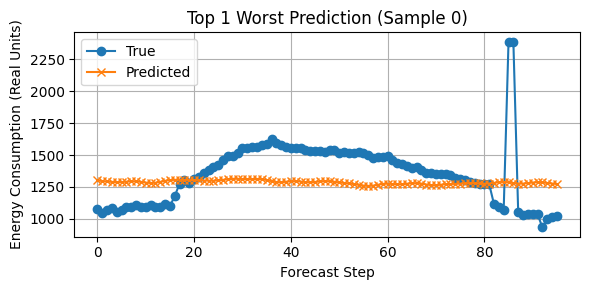

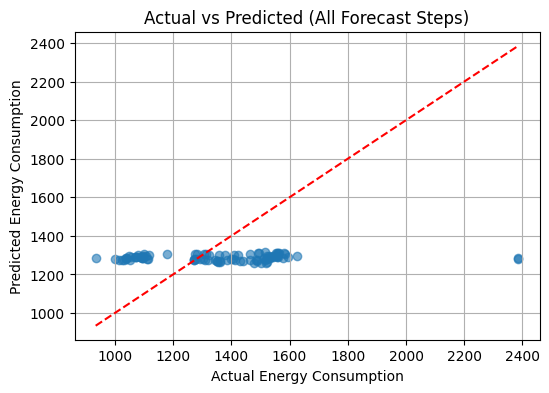

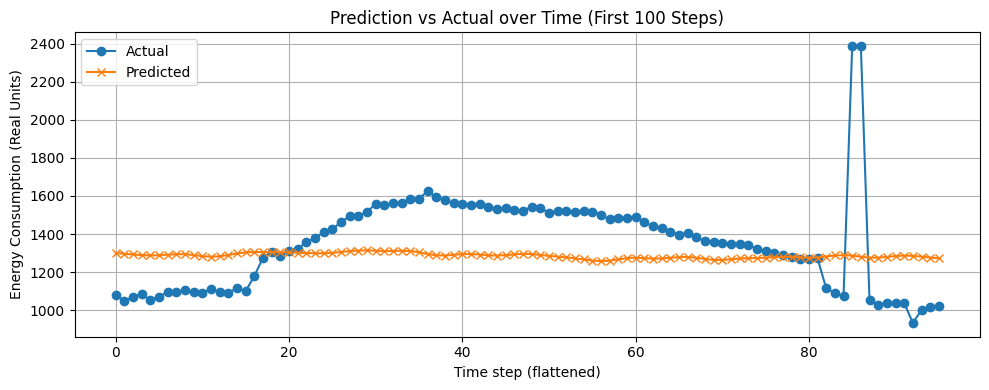

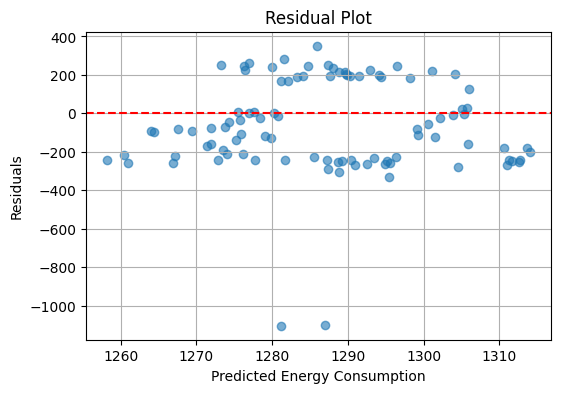

In [ ]:
    device = torch.device("cuda" )
    L = 96  # sequence length
    pred_len=96
    lr= 0.001
    num_epochs=100
    batch_size=32
    train_loader, val_loader,X_date_seq, y_data_seq, scaler_x, scaler_y  = get_data_loaders_bothNormalize('DASH_RAWDATA-01012022-31122022.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)
    test_loader = val_loader
    for X_batch, y_batch in test_loader:
        input_sequence = X_batch[0].unsqueeze(0)  # [1, src_len, 1]
        target_sequence = y_batch[0]  # [pred_len]
        break
    trained_model = TransformerEncoderDecoderWithLSTM(
            input_size=1,
            d_model=64,
            nhead=4,
            num_encoder_layers=3,
            num_decoder_layers=3,
            dim_feedforward=512,
            dropout=.4486,
            pred_len=96,
            lstm_hidden_size=64

    )
    trained_model.load_state_dict(torch.load("best_encoderDecoder_model_wts.pth"))
    trained_model.to(device)


    predicted_sequence  = inference_encoderdecoder_lstm(trained_model,input_sequence=input_sequence, pred_len=96, device=device)
    # Predict using your inference model
    #predicted_sequence = inference_model.infer(input_sequence)

    print("Predicted:", predicted_sequence)
    print("True:", target_sequence)

    predicted_sequence = predicted_sequence.detach().cpu().numpy()
    true_target = target_sequence.detach().cpu().numpy()

    evaluate_model( predicts=predicted_sequence.reshape(1, -1), actuals=true_target.reshape(1, -1), scaler_y=scaler_y)



In [ ]:
def inference_encoderdecoder_lstm(model, input_sequence, pred_len, device):
    """
    Inference function for TransformerEncoderDecoderWithLSTM model (autoregressive).

    Args:
        model: Trained TransformerEncoderDecoderWithLSTM model.
        input_sequence: representing the input sequence.
        pred_len: Number of steps to predict.
        device: 'cuda' or 'cpu'.

    Returns:
        predictions: Tensor of shape [pred_len].
    """

    model.eval()
    model.to(device)
    input_sequence = input_sequence.to(device)

    with torch.no_grad():
        # Encoder input projection and positional encoding
        src_proj = model.input_proj(input_sequence)
        src_proj = model.pos_encoder(src_proj)

        # Encode
        memory = model.encoder(src_proj)

        # Decoder input starts with zero token
        decoder_input = torch.zeros((1, 1, 1), device=device)  # [batch=1, seq_len=1, features=1]

        preds = []

        for step in range(pred_len):
            tgt_proj = model.output_proj(decoder_input)
            tgt_proj = model.pos_decoder(tgt_proj)

            tgt_mask = generate_square_subsequent_mask(tgt_proj.size(1)).to(device)

            # Decoder processing
            decoder_out = model.decoder(tgt_proj, memory, tgt_mask=tgt_mask)

            # LSTM processing on decoder output
            lstm_out, _ = model.lstm(decoder_out)

            # Final projection to prediction
            output = model.fc_out(lstm_out)  # [batch, seq_len, 1]

            # Take last prediction
            next_value = output[:, -1, :]  # [1, 1]

            preds.append(next_value)


            decoder_input = torch.cat([decoder_input, next_value.unsqueeze(1)], dim=1)

        # After loop, concatenate predictions
        preds = torch.cat(preds, dim=1)  # [1, pred_len]

    return preds.squeeze(0)  # [pred_len]


In [ ]:
#   Masking Function
def generate_square_subsequent_mask(sz):
    """Generate a causal mask (lower-triangular) for decoder self-attention."""
    mask = torch.triu(torch.ones((sz, sz)), diagonal=1)
    mask = mask.masked_fill(mask == 1, float('-inf'))
    return mask  # Shape: [sz, sz]

# **TransformerEncoderDecoder**

In [ ]:

#   Encoder-Decoder Transformer for Time Series
class TransformerEncoderDecoder(nn.Module):

    """
    Transformer-based Encoder-Decoder model

    This model uses a Transformer encoder to encode historical input sequences and
    a Transformer decoder to predict future values based on encoded memory.

    Args:
        input_size: Number of input features per time step.
        d_model : Dimension of embeddings (model size) for Transformer layers.
        nhead : Number of attention heads in multi-head self-attention.
        num_encoder_layers: Number of stacked Transformer encoder layers.
        num_decoder_layers: Number of stacked Transformer decoder layers.
        dim_feedforward : Dimension of the feedforward network in each Transformer layer.
        dropout : Dropout rate applied in Transformer layers.
        pred_len: Number of future time steps to predict.

    Returns:
        output: Predicted sequence tensor of shape [batch_size, tgt_len].
    """
    def __init__(self, input_size, d_model, nhead, num_encoder_layers, num_decoder_layers,
                 dim_feedforward, dropout, pred_len):
        super(TransformerEncoderDecoder, self).__init__()

        self.pred_len = pred_len
        self.d_model = d_model

        # Input projection layers
        self.input_proj = nn.Linear(input_size, d_model)
        self.output_proj = nn.Linear(1, d_model)  # For decoder input (future steps)

        # Positional encoding
        self.pos_encoder = PositionalEncoding(d_model)
        self.pos_decoder = PositionalEncoding(d_model)

        # Transformer encoder and decoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward,
            dropout=dropout, batch_first=True
        )
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        decoder_layer = nn.TransformerDecoderLayer(
            d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward,
            dropout=dropout, batch_first=True
        )
        self.decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_decoder_layers)

        # Final output layer
        self.fc_out = nn.Linear(d_model, 1)  # Predict one value per step

    def forward(self, src, tgt):

        batch_size = src.size(0)

        # Project inputs
        src = self.input_proj(src)            # [batch, src_len, d_model]
        src = self.pos_encoder(src)

        tgt = self.output_proj(tgt)            # [batch, tgt_len, d_model]
        tgt = self.pos_decoder(tgt)

        # Create causal mask for decoder
        tgt_mask = generate_square_subsequent_mask(tgt.size(1)).to(tgt.device)

        # Encode
        memory = self.encoder(src)  # [batch, src_len, d_model]

        # Pass tgt_mask into the decoder
        output = self.decoder(tgt, memory, tgt_mask=tgt_mask)

        # Final projection to output value
        output = self.fc_out(output)  # [batch, tgt_len, 1]

        return output.squeeze(-1)  # [batch, tgt_len]


In [ ]:
def validating_encoder_decoder_teacher_forcing(model, val_loader, criterion, device, pred_len):
    """
    Validate Transformer Encoder-Decoder model using Teacher Forcing

    Args:
        model: TransformerEncoderDecoder instance.
        val_loader: DataLoader for validation data.
        criterion: Loss function (MSELoss).
        device: 'cuda' or 'cpu'.
        pred_len: Number of steps to predict.

    Returns:
        avg_val_loss: Average validation loss.
        all_preds: Tensor of predictions [num_samples, pred_len].
        all_targets: Tensor of actual targets [num_samples, pred_len].
    """

    model.eval()
    val_loss = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for X_val, y_val in val_loader:
            X_val, y_val = X_val.to(device), y_val.to(device)

            batch_size = X_val.size(0)

            # Prepare full decoder input using ground-truth (teacher forcing)
            decoder_input = torch.zeros((batch_size, pred_len, 1), device=device)
            decoder_input[:, 1:, 0] = y_val[:, :-1]  # shift ground-truth to the right
            decoder_input[:, 0, 0] = 0  # Start token

            # Forward pass (full sequence)
            preds = model(X_val, decoder_input)  # [batch_size, pred_len]

            # Compute loss
            loss = criterion(preds, y_val)
            val_loss += loss.item()

            all_preds.append(preds.cpu())
            all_targets.append(y_val.cpu())

    all_preds = torch.cat(all_preds, dim=0)    # [num_samples, pred_len]
    all_targets = torch.cat(all_targets, dim=0)  # [num_samples, pred_len]

    avg_val_loss = val_loss / len(val_loader)

    return avg_val_loss, all_preds, all_targets


In [ ]:
def run_epochs_encoderDecoder(model, train_loader, val_loader, num_epochs, lr, device, scaler_x, scaler_y,pred_len):

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()
    # Initialize best tracking
    best_val_loss = float('inf')
    best_model_wts = copy.deepcopy(model.state_dict())

      # Store loss history
    train_losses = []
    val_losses = []
    for epoch in range(num_epochs):

      ave_train_loss = training_encoder_decoder(model, train_loader,criterion , optimizer, device,pred_len)
      avg_val_loss,predictions,actuals = validating_encoder_decoder_teacher_forcing(model, val_loader, criterion,device,pred_len)

      train_losses.append(ave_train_loss)
      val_losses.append(avg_val_loss)

      #check if this is the new best ──
      if  avg_val_loss < best_val_loss:
            best_val_loss = ave_train_loss
            best_encoderDecoder_model_wts = copy.deepcopy(model.state_dict())


      print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {ave_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")
     # writer.add_scalar("Loss/train", ave_train_loss, epoch)
     # writer.add_scalar("Loss/val", avg_val_loss, epoch)


    print(f"Best Val Loss: {best_val_loss:.4f}")

    PATH = "best_encoderDecoder_model_wts.pth"
    torch.save(best_encoderDecoder_model_wts, PATH)

    writer.add_scalar("Best Val Loss", best_val_loss, epoch)
    # Plot losses
    plt.figure()
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()
    writer.close()

    return  best_model_wts


In [ ]:
def training_encoder_decoder(model, train_loader, criterion, optimizer, device, pred_len):
    """
    Train Transformer encoder-decoder model for one epoch.

    Args:
        model: TransformerEncoderDecoder instance.
        train_loader: DataLoader for training data.
        criterion: Loss function (e.g., MSELoss).
        optimizer: Optimizer (e.g., Adam).
        device: Device ('cuda' or 'cpu').
        pred_len: Number of steps to predict (output sequence length).

    Returns:
        avg_train_loss: Average training loss over epoch.
    """

    model.train()
    total_loss = 0
    model=model.to(device)

    for X_batch, y_batch in train_loader:
        X_batch = X_batch.to(device)   # [batch_size, input_seq_len, 1]
        y_batch = y_batch.to(device)   # [batch_size, pred_len]

        optimizer.zero_grad()

        # Prepare decoder input (teacher forcing):
        # Shift y_batch one step to the right, prepend zeros as first input
        batch_size = y_batch.size(0)

        decoder_input = torch.zeros((batch_size, pred_len, 1),device=device)
        decoder_input[:, 1:, 0] = y_batch[:, :-1]
        decoder_input[:, 0, 0] = 0  # Start token (e.g., zero)

        # Forward pass through the model
        preds = model(X_batch, decoder_input)  # [batch_size, pred_len]

        # Compute loss
        loss = criterion(preds, y_batch)

        # Backpropagation
        loss.backward()

        # Gradient clipping (optional but recommended for stability)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Optimizer step
        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)

    return avg_train_loss


In [ ]:
import torch
import torch.nn as nn

class InferenceTransformerEncoderDecoder(nn.Module):


    def __init__(self, model):
        """
        Args:
            model: Pre-trained Transformer Encoder-Decoder model.
        """
        super(InferenceTransformerEncoderDecoder, self).__init__()
        self.model = model

    def infer(self, input_sequence, pred_len=96):
        """
        Generates future energy consumption predictions given a past input sequence.

        Args:
            input_sequence (torch.Tensor): Tensor of shape [batch_size, input_seq_len, 1].
            pred_len: Number of future steps to predict ( = 96).

        Returns:
            predictions (torch.Tensor): Predicted future values of shape [batch_size, pred_len].
        """

        self.model.eval()
        device = next(self.model.parameters()).device
        input_sequence = input_sequence.to(device)

        batch_size = input_sequence.size(0)

        # Initialize decoder input with zeros and fill the first step
        decoder_input = torch.zeros((batch_size, 1, 1), device=device)

        predictions = []

        # Encode the input sequence once
        src_embedded = self.model.input_proj(input_sequence)
        src_embedded = self.model.pos_encoder(src_embedded)
        memory = self.model.encoder(src_embedded)

        for step in range(pred_len):
            # Project decoder input
            tgt_embedded = self.model.output_proj(decoder_input)
            tgt_embedded = self.model.pos_decoder(tgt_embedded)

            # Create a causal mask for current step
            tgt_mask = generate_square_subsequent_mask(tgt_embedded.size(1)).to(device)

            # Decode
            output = self.model.decoder(tgt_embedded, memory, tgt_mask=tgt_mask)

            # Project to output
            pred = self.model.fc_out(output[:, -1, :]) # Take last time step
            predictions.append(pred.squeeze(-1))  # [batch_size]

            # Add prediction to decoder input
            next_input = pred.unsqueeze(1)  # [batch_size, 1, 1]
            decoder_input = torch.cat([decoder_input, next_input], dim=1)  # expand decoder input

        # Stack predictions
        predictions = torch.stack(predictions, dim=1)  # [batch_size, pred_len]

        return predictions


Transformer Encoder-Decoder model loaded for inference!
Predicted: tensor([[-0.0922, -0.1667, -0.2255, -0.2657, -0.2906, -0.3194, -0.3597, -0.4153,
         -0.4798, -0.5240, -0.5477, -0.5698, -0.5917, -0.6185, -0.6603, -0.7053,
         -0.7351, -0.7647, -0.8027, -0.8388, -0.8641, -0.8799, -0.8863, -0.8851,
         -0.8725, -0.8450, -0.8098, -0.7931, -0.7758, -0.7316, -0.6644, -0.6044,
         -0.5815, -0.6036, -0.6004, -0.5704, -0.5620, -0.5630, -0.5650, -0.5721,
         -0.5577, -0.5253, -0.4928, -0.4704, -0.4606, -0.4596, -0.4546, -0.4307,
         -0.4038, -0.4076, -0.4247, -0.4410, -0.4501, -0.4404, -0.4196, -0.4065,
         -0.4089, -0.4273, -0.4559, -0.4673, -0.4576, -0.4556, -0.4615, -0.4709,
         -0.4920, -0.5219, -0.5392, -0.5375, -0.5321, -0.5348, -0.5567, -0.5830,
         -0.5978, -0.6056, -0.6123, -0.6244, -0.6441, -0.6612, -0.6683, -0.6703,
         -0.6712, -0.6719, -0.6753, -0.6892, -0.7034, -0.7084, -0.7054, -0.6996,
         -0.6927, -0.6956, -0.7027, -0.698

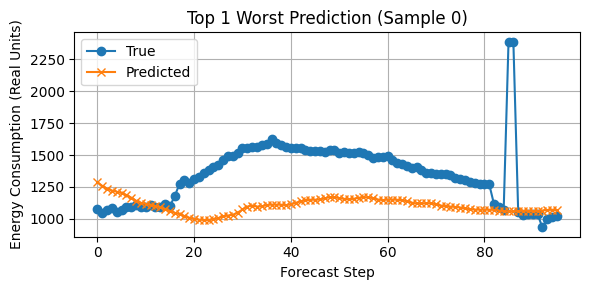

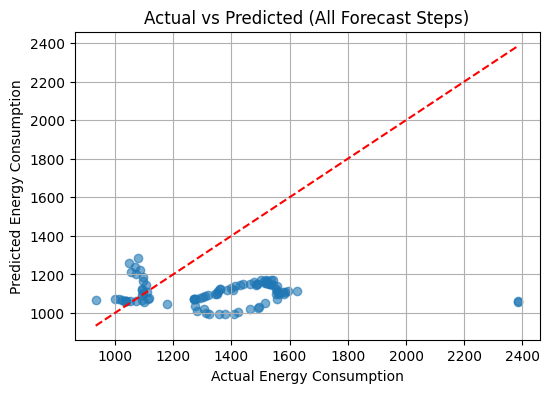

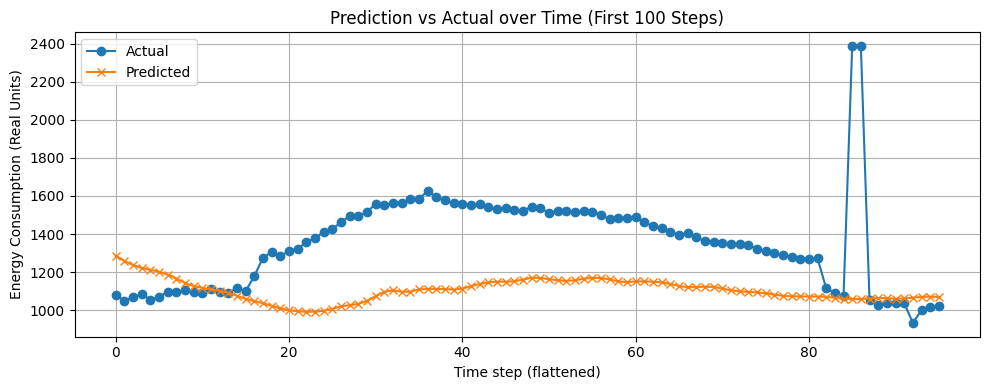

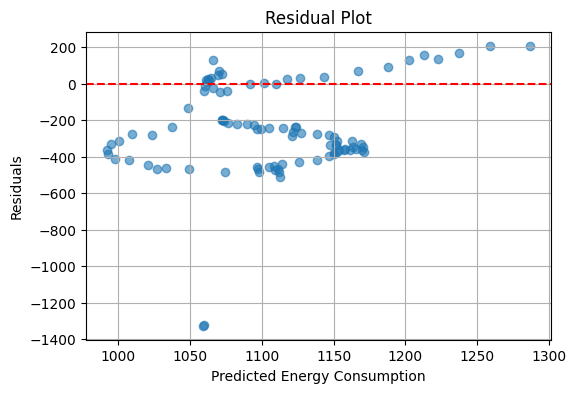

In [ ]:
    device = torch.device("cuda" )
    L = 96  # sequence length
    pred_len=96
    lr= 0.001
    num_epochs=100
    batch_size=32

    train_loader, val_loader,X_date_seq, y_data_seq, scaler_x, scaler_y  = get_data_loaders_bothNormalize('DASH_RAWDATA-01012022-31122022.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)
    test_loader = val_loader
    for X_batch, y_batch in test_loader:
        input_sequence = X_batch[0].unsqueeze(0)  # [1, src_len, 1]
        target_sequence = y_batch[0]  # [pred_len]
        break

    trained_model = TransformerEncoderDecoder(
        input_size=1,
        d_model=64,
        nhead=4,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=128,
        dropout=.1,
        pred_len=pred_len)

    trained_model.load_state_dict(torch.load("best_encoderDecoder_model_wts.pth"))
    trained_model.to(device)

        # Create inference object
    inference_model = InferenceTransformerEncoderDecoder(trained_model)
    print("Transformer Encoder-Decoder model loaded for inference!")

    # Example: suppose you have an input sequence
    # input_sequence.shape = [batch_size, 96, 1]
    predicted_sequence = inference_model.infer(input_sequence, pred_len=96)

   # predicted_sequence  = inference_encoder_decoder(trained_model,input_sequence=input_sequence, pred_len=96, device=device)
    # Predict using your inference model
    #predicted_sequence = inference_model.infer(input_sequence)

    print("Predicted:", predicted_sequence)
    print("True:", target_sequence)

    predicted_sequence = predicted_sequence.detach().cpu().numpy()
    true_target = target_sequence.detach().cpu().numpy()

    evaluate_model( predicts=predicted_sequence.reshape(1, -1), actuals=true_target.reshape(1, -1), scaler_y=scaler_y)



# Trainig and Validation loss Plots

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def evaluate_model(predicts, actuals, scaler_y):

    """
    Evaluate model predictions after inverse transforming them
    using the fitted StandardScaler for y (scaler_y).

    Args:
        predicts (np.ndarray): Model predicted outputs (normalized) [num_samples, pred_len].
        actuals (np.ndarray): Ground-truth outputs (normalized) [num_samples, pred_len].
        scaler_y: Fitted StandardScaler for inverse-transforming y.
    """

    # Step 1: Ensure correct shape before inverse transforming
    predicts_reshaped = predicts.reshape(-1, predicts.shape[-1])  # shape [samples, pred_len]
    actuals_reshaped = actuals.reshape(-1, actuals.shape[-1])


    # Step 2: Inverse-transform predictions and actuals
    predicts_real = scaler_y.inverse_transform(predicts_reshaped)
    actuals_real = scaler_y.inverse_transform(actuals_reshaped)



    # Step 3: Calculate metrics on real values
    mse = np.mean((actuals_real - predicts_real) ** 2)
    rmse = np.sqrt(mse)
    mae = np.mean(np.abs(actuals_real - predicts_real))
    relative_rmse = (rmse / np.mean(actuals_real)) * 100

    print(f"RMSE: {rmse:.4f}")
    print(f"Relative RMSE: {relative_rmse:.4f}%")
    print(f"MAE: {mae:.4f}")

    # Step 4: Compute error per sample (sequence-level error)
    sample_errors = np.mean(np.abs(predicts_real - actuals_real), axis=1)  # [num_samples]

    # Step 5: Identify top 10 worst predictions
    top10_indices = np.argsort(sample_errors)[-10:][::-1]

    for i, idx in enumerate(top10_indices):
        plt.figure(figsize=(6, 3))
        plt.plot(actuals_real[idx], label='True', marker='o')
        plt.plot(predicts_real[idx], label='Predicted', marker='x')
        plt.title(f'Top {i+1} Worst Prediction (Sample {idx})')
        plt.xlabel('Forecast Step')
        plt.ylabel('Energy Consumption (Real Units)')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Step 6: Actual vs Predicted Scatter Plot (flattened)
    plt.figure(figsize=(6, 4))
    plt.scatter(actuals_real.flatten(), predicts_real.flatten(), alpha=0.6)
    min_val, max_val = actuals_real.min(), actuals_real.max()
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')
    plt.xlabel("Actual Energy Consumption")
    plt.ylabel("Predicted Energy Consumption")
    plt.title("Actual vs Predicted (All Forecast Steps)")
    plt.grid(True)
    plt.show()

    # Step 7: Time-Series Line Plot (first 100 points flattened)
    plt.figure(figsize=(10, 4))
    plt.plot(actuals_real.flatten()[:100], label="Actual", marker='o')
    plt.plot(predicts_real.flatten()[:100], label="Predicted", marker='x')
    plt.xlabel("Time step (flattened)")
    plt.ylabel("Energy Consumption (Real Units)")
    plt.title("Prediction vs Actual over Time (First 100 Steps)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Step 8: Residual Plot
    residuals = predicts_real.flatten() - actuals_real.flatten()
    plt.figure(figsize=(6, 4))
    plt.scatter(predicts_real.flatten(), residuals, alpha=0.6)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel("Predicted Energy Consumption")
    plt.ylabel("Residuals")
    plt.title("Residual Plot")
    plt.grid(True)
    plt.show()


In [ ]:
import copy
torch.manual_seed(12345  )

In [ ]:
device = torch.device("cuda" )
L = 96  # sequence length
pred_len=96
lr= 0.001
num_epochs=100
batch_size=32
#train_loader, val_loader,X_date_seq, y_data_seq, scaler_x, scaler_y = get_data_loaders2('/content/drive/MyDrive/Course/Deep/Project/Dataset/DASH_RAWDATA01012024-3122024.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)
train_loader, val_loader,X_date_seq, y_data_seq, scaler_x, scaler_y  = get_data_loaders_bothNormalize('DASH_RAWDATA01012024-3122024.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)
test_loader = val_loader



Epoch 1/100 | Train Loss: 0.1821 | Val Loss: 0.1270
Epoch 2/100 | Train Loss: 0.1128 | Val Loss: 0.0608
Epoch 3/100 | Train Loss: 0.0962 | Val Loss: 0.0421
Epoch 4/100 | Train Loss: 0.0820 | Val Loss: 0.0551
Epoch 5/100 | Train Loss: 0.0764 | Val Loss: 0.0431
Epoch 6/100 | Train Loss: 0.0714 | Val Loss: 0.0426
Epoch 7/100 | Train Loss: 0.0659 | Val Loss: 0.0333
Epoch 8/100 | Train Loss: 0.0672 | Val Loss: 0.0320
Epoch 9/100 | Train Loss: 0.0628 | Val Loss: 0.0327
Epoch 10/100 | Train Loss: 0.0614 | Val Loss: 0.0292
Epoch 11/100 | Train Loss: 0.0607 | Val Loss: 0.0301
Epoch 12/100 | Train Loss: 0.0595 | Val Loss: 0.0267
Epoch 13/100 | Train Loss: 0.0604 | Val Loss: 0.0325
Epoch 14/100 | Train Loss: 0.0574 | Val Loss: 0.0285
Epoch 15/100 | Train Loss: 0.0574 | Val Loss: 0.0267
Epoch 16/100 | Train Loss: 0.0569 | Val Loss: 0.0266
Epoch 17/100 | Train Loss: 0.0574 | Val Loss: 0.0260
Epoch 18/100 | Train Loss: 0.0561 | Val Loss: 0.0255
Epoch 19/100 | Train Loss: 0.0559 | Val Loss: 0.0252
Ep

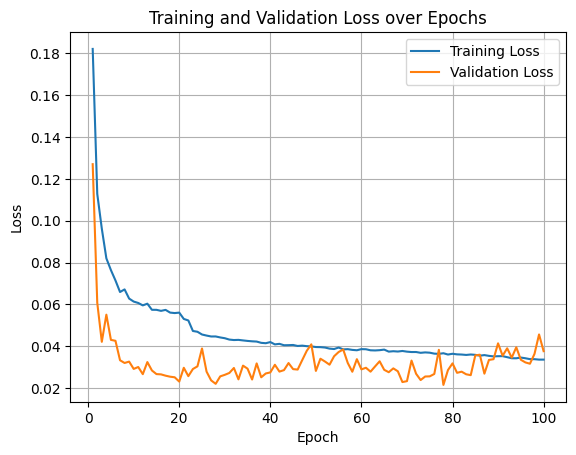

In [ ]:

TransformerEncoderDecoderWithLSTM_model = TransformerEncoderDecoderWithLSTM(
        input_size=1,
        d_model=64,
        nhead=4,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=512,
        dropout=.4486,
        pred_len=96,
        lstm_hidden_size=64

)
trained_model = run_epochs_encoder_decoder_lstm(
    model=TransformerEncoderDecoderWithLSTM_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device,
    pred_len=96
)

lr= 0.001
num_epochs=100
batch_size=64

Epoch 1/100 | Train Loss: 0.1032 | Val Loss: 0.0359
Epoch 2/100 | Train Loss: 0.0788 | Val Loss: 0.0353
Epoch 3/100 | Train Loss: 0.0742 | Val Loss: 0.0416
Epoch 4/100 | Train Loss: 0.0732 | Val Loss: 0.0346
Epoch 5/100 | Train Loss: 0.0730 | Val Loss: 0.0280
Epoch 6/100 | Train Loss: 0.0723 | Val Loss: 0.0267
Epoch 7/100 | Train Loss: 0.0712 | Val Loss: 0.0281
Epoch 8/100 | Train Loss: 0.0707 | Val Loss: 0.0298
Epoch 9/100 | Train Loss: 0.0704 | Val Loss: 0.0287
Epoch 10/100 | Train Loss: 0.0700 | Val Loss: 0.0279
Epoch 11/100 | Train Loss: 0.0696 | Val Loss: 0.0265
Epoch 12/100 | Train Loss: 0.0694 | Val Loss: 0.0271
Epoch 13/100 | Train Loss: 0.0689 | Val Loss: 0.0287
Epoch 14/100 | Train Loss: 0.0686 | Val Loss: 0.0268
Epoch 15/100 | Train Loss: 0.0682 | Val Loss: 0.0262
Epoch 16/100 | Train Loss: 0.0675 | Val Loss: 0.0269
Epoch 17/100 | Train Loss: 0.0664 | Val Loss: 0.0273
Epoch 18/100 | Train Loss: 0.0659 | Val Loss: 0.0270
Epoch 19/100 | Train Loss: 0.0650 | Val Loss: 0.0255
Ep

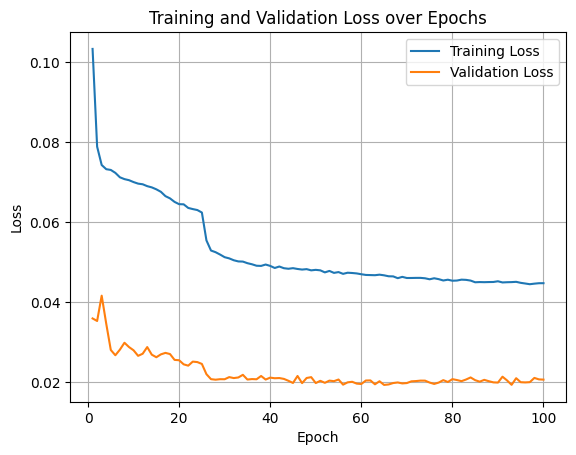

In [ ]:

# before Settinh Hyperparameters  with greedSearch
TransformerEncoderLSTMDecoder_model = TransformerEncoderLSTMDecoder(
    input_size=1,
    d_model=64,
    nhead=4,
    num_encoder_layers=2,
    num_decoder_layers=2,
    dim_feedforward=128,
    dropout=.1,
    pred_len=pred_len,
    lstm_hidden_size=64
)
trainedTransformerEncoderLSTMDecoder_model = run_epochs_encoder_lstm_decoder(
    model=TransformerEncoderLSTMDecoder_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device,
    pred_len=pren_len
)

Epoch 1/100 | Train Loss: 0.1208 | Val Loss: 0.0276
Epoch 2/100 | Train Loss: 0.0816 | Val Loss: 0.0282
Epoch 3/100 | Train Loss: 0.0826 | Val Loss: 0.0343
Epoch 4/100 | Train Loss: 0.0785 | Val Loss: 0.0315
Epoch 5/100 | Train Loss: 0.0765 | Val Loss: 0.0371
Epoch 6/100 | Train Loss: 0.0746 | Val Loss: 0.0324
Epoch 7/100 | Train Loss: 0.0743 | Val Loss: 0.0332
Epoch 8/100 | Train Loss: 0.0739 | Val Loss: 0.0331
Epoch 9/100 | Train Loss: 0.0738 | Val Loss: 0.0320
Epoch 10/100 | Train Loss: 0.0729 | Val Loss: 0.0273
Epoch 11/100 | Train Loss: 0.0731 | Val Loss: 0.0271
Epoch 12/100 | Train Loss: 0.0727 | Val Loss: 0.0299
Epoch 13/100 | Train Loss: 0.0724 | Val Loss: 0.0356
Epoch 14/100 | Train Loss: 0.0718 | Val Loss: 0.0348
Epoch 15/100 | Train Loss: 0.0723 | Val Loss: 0.0375
Epoch 16/100 | Train Loss: 0.0722 | Val Loss: 0.0279
Epoch 17/100 | Train Loss: 0.0711 | Val Loss: 0.0287
Epoch 18/100 | Train Loss: 0.0704 | Val Loss: 0.0285
Epoch 19/100 | Train Loss: 0.0700 | Val Loss: 0.0255
Ep

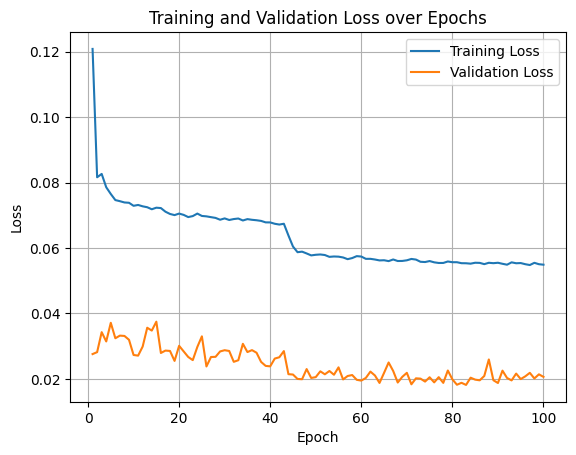

In [ ]:
#After Setting  Hyperparameters  with greedSearch
TransformerEncoderLSTMDecoder_model = TransformerEncoderLSTMDecoder(
        input_size=1,
        d_model=64,
        nhead=8,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=512,
        dropout=.133,
        pred_len=96,
        lstm_hidden_size=128
    ).to(device)
trainedTransformerEncoderLSTMDecoder_model = run_epochs_encoder_lstm_decoder(
    model=TransformerEncoderLSTMDecoder_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device,
    pred_len=96
)

Epoch 1/100 | Train Loss: 0.1158 | Val Loss: 0.0953
Epoch 2/100 | Train Loss: 0.0900 | Val Loss: 0.0545
Epoch 3/100 | Train Loss: 0.0862 | Val Loss: 0.0370
Epoch 4/100 | Train Loss: 0.0810 | Val Loss: 0.1002
Epoch 5/100 | Train Loss: 0.0758 | Val Loss: 0.0493
Epoch 6/100 | Train Loss: 0.0705 | Val Loss: 0.0413
Epoch 7/100 | Train Loss: 0.0726 | Val Loss: 0.0372
Epoch 8/100 | Train Loss: 0.0675 | Val Loss: 0.0318
Epoch 9/100 | Train Loss: 0.0662 | Val Loss: 0.0356
Epoch 10/100 | Train Loss: 0.0649 | Val Loss: 0.0313
Epoch 11/100 | Train Loss: 0.0640 | Val Loss: 0.0322
Epoch 12/100 | Train Loss: 0.0661 | Val Loss: 0.0233
Epoch 13/100 | Train Loss: 0.0635 | Val Loss: 0.0273
Epoch 14/100 | Train Loss: 0.0629 | Val Loss: 0.0248
Epoch 15/100 | Train Loss: 0.0621 | Val Loss: 0.0243
Epoch 16/100 | Train Loss: 0.0610 | Val Loss: 0.0225
Epoch 17/100 | Train Loss: 0.0621 | Val Loss: 0.0235
Epoch 18/100 | Train Loss: 0.0609 | Val Loss: 0.0374
Epoch 19/100 | Train Loss: 0.0601 | Val Loss: 0.0343
Ep

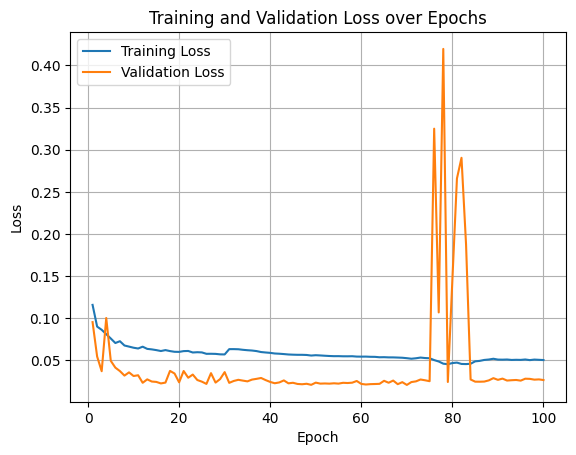

In [ ]:

TransformerEncoderDecoder_model=TransformerEncoderDecoder(
        input_size=1,
        d_model=64,
        nhead=4,
        num_encoder_layers=3,
        num_decoder_layers=3,
        dim_feedforward=128,
        dropout=.1,
        pred_len=pred_len)
trained_TransformerEncoderDecoder_model = run_epochs_encoderDecoder(
    model=TransformerEncoderDecoder_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device,
    scaler_x=scaler_x,
    scaler_y=scaler_y,
    pred_len=pred_len
   )

# other  efforts

in this part tary to evaluate othe combination of methods such as Transformers
  just with encoder and ctrating a custom model to tray Noam Normalization and  anneling learnig rate

In [ ]:
class TransformerBiLSTM(nn.Module):
    def __init__(self, input_size, d_model, nhead, num_encoder_layers, dim_feedforward,
                 dropout, pred_len, lstm_hidden_size, lstm_layers):
        super().__init__()
        self.pred_len = pred_len

        self.input_proj = nn.Linear(input_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=True
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # BiLSTM (bidirectional = True)
        self.bilstm = nn.LSTM(
            input_size=d_model,
            hidden_size=lstm_hidden_size,
            num_layers=lstm_layers,
            bidirectional=True,
            batch_first=True
        )

        # Output layer must match 2 * hidden_size (forward + backward)
        self.fc_out = nn.Linear(lstm_hidden_size * 2, pred_len)

    def forward(self, x):
        # x: [batch, seq_len, input_size]
        x = self.input_proj(x)              # [batch, seq_len, d_model]
        x = self.pos_encoder(x)             # [batch, seq_len, d_model]
        x = self.transformer_encoder(x)     # [batch, seq_len, d_model]

        lstm_out, _ = self.bilstm(x)        # [batch, seq_len, 2 * hidden_size]
        final = lstm_out[:, -1, :]          # use last time step [batch, 2 * hidden_size]
        out = self.fc_out(final)            # [batch, pred_len]

        return out


In [ ]:
import torch
import torch.nn as nn
import math
from torch.utils.data import DataLoader

# Custom Transformer Encoder Layer using RMSNorm
# In PyTorch, nn.Module is the base class for all neural network component ike .to(),.eval(),.train()
 # Inheriting from nn.Module makes the class a true PyTorch model, with all the needed features.

# Custom RMSNorm
class RMSNorm(nn.Module):
    '''
    Arguments
      ---------
      d_model: the number of features per input vector
      eps: a small value to avoid division by zero
    '''
    def __init__(self, d_model, eps=1e-8):
        super(RMSNorm, self).__init__()
        self.eps = eps
        self.scale = nn.Parameter(torch.ones(d_model))

    def forward(self, x):
        norm = x.norm(2, dim=-1, keepdim=True)
        rms = norm / math.sqrt(x.shape[-1])
        return self.scale * (x / (rms + self.eps))


class CustomTransformerEncoderLayer(nn.Module):
    def __init__(self, d_model, nhead, dim_feedforward, dropout):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)

        self.norm1 = RMSNorm(d_model)
        self.norm2 = RMSNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.activation = nn.ReLU()

    def forward(self, src):

        src2, _ = self.self_attn(src, src, src)
        src = src + self.dropout1(src2)
        src = self.norm1(src)
        src2 = self.linear2(self.dropout(self.activation(self.linear1(src))))

        src = src + self.dropout2(src2)
        src = self.norm2(src)
        return src

# # Transformer + LSTM Hybrid Model
class CustomTransformerLSTM(nn.Module):
    def __init__(self, input_size, d_model, nhead, num_encoder_layers, lstm_hidden, num_lstm_layers,dim_feedforward,dropout):
        super(CustomTransformerLSTM, self).__init__()
        self.input_proj = nn.Linear(input_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)

        self.encoder_layers = nn.ModuleList(
            [CustomTransformerEncoderLayer(d_model, nhead,dim_feedforward,dropout) for _ in range(num_encoder_layers)]
        )

        self.lstm = nn.LSTM(d_model, lstm_hidden, num_lstm_layers, batch_first=True)
        self.fc_out = nn.Linear(lstm_hidden, 1)

    def forward(self, x):
        x = self.input_proj(x)
        x = self.pos_encoder(x)
        for layer in self.encoder_layers:
            x = layer(x)
        lstm_out, _ = self.lstm(x)
        out = self.fc_out(lstm_out[:, -1, :])
        return out.squeeze(-1)


In [ ]:

class TransformerLSTM(nn.Module):
    def __init__(self, input_size, d_model, nhead, num_encoder_layers, dim_feedforward,
                 dropout, pred_len, lstm_hidden_size, lstm_layers):
        super().__init__()
        self.pred_len = pred_len

        self.input_proj = nn.Linear(input_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=nhead,
            dim_feedforward=dim_feedforward,
            dropout=dropout,
            batch_first=True
        )
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        # LSTM layer after Transformer
        self.lstm = nn.LSTM(
            input_size=d_model,
            hidden_size=lstm_hidden_size,
            num_layers=lstm_layers,
            batch_first=True
        )

        self.fc_out = nn.Linear(lstm_hidden_size, pred_len)

    def forward(self, x):
        # x: [batch_size, seq_len, input_size]
        x = self.input_proj(x)          # [batch, seq_len, d_model]
        x = self.pos_encoder(x)         # [batch, seq_len, d_model]

        x = self.transformer_encoder(x) # [batch, seq_len, d_model]

        # Feed the output sequence to LSTM
        lstm_out, _ = self.lstm(x)      # [batch, seq_len, lstm_hidden_size]

        # Use only the last LSTM output for final prediction
        final = lstm_out[:, -1, :]      # [batch, lstm_hidden_size]
        out = self.fc_out(final)        # [batch, pred_len]

        return out


In [ ]:
import math
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import LambdaLR
def get_noam_scheduler(optimizer, model_size, warmup_steps=4000):
    '''
      Creates a Noam learning rate scheduler (used in Transformer models).
        The learning rate increases linearly for the first `warmup_steps` training steps,
        then decreases proportionally to the inverse square root of the step number.

        Args:
            optimizer (torch.optim.Optimizer): The optimizer for which to adjust the learning rate.
            model_size (int): The dimensionality of the model (typically same as d_model).
            warmup_steps (int): The number of steps for warmup (default: 4000).

        Returns:
            scheduler (torch.optim.lr_scheduler.LambdaLR): A learning rate scheduler that can be stepped per batch.
     '''
    def lr_lambda(step):
        if step == 0:
            step = 1
        return model_size ** -0.5 * min(step ** -0.5, step * warmup_steps ** -1.5)

    return LambdaLR(optimizer, lr_lambda)

In [ ]:

def training(model, train_loader,criterion,optimizer, epoch_index, device):

    model.to(device)
    model.train()
    epoch_loss=0
  # Training Loop for an epoch
    for batch_idx, (X_batch, y_batch) in enumerate(train_loader):
    #   if batch_idx > 0: #for overfitting test
    # break  # stop after processing the first batch
      X_batch, y_batch = X_batch.to(device), y_batch.to(device)

      # raw_batch_data = inspect_batch(batch_index=batch_idx,
      #                           X_seq=X_batch,
      #                           y_seq=y_batch,
      #                           X_date_seq=X_date_seq,
      #                           y_date_seq=y_data_seq,
      #                          scaler_x=scaler_x ,
      #                          scaler_y=scaler_y,
      #                          batch_size=batch_size)
      raw_batch_data = inspect_batch(batch_index=batch_idx,
                          X_seq=X_batch,
                          y_seq=y_batch,
                          X_date_seq=X_date_seq,
                          y_date_seq=y_data_seq,
                          batch_size=batch_size)

      log_batch_to_tensorboard(writer, epoch_index, batch_idx, raw_batch_data)

      model.zero_grad()
      # Run Model
      # tgt_input = torch.zeros_like(y_batch).unsqueeze(-1)  # Make it [batch, pred_len, 1]
      # tgt_input[:, 1:, :] = y_batch[:, :-1].unsqueeze(-1)  # Shift ground truth
      # tgt_input[:, 0, :] = 0                                   # First input = start token (0)


      preds = model(X_batch)
      #preds = model(X_batch,tgt_input)
      # Compute the losse
      loss = criterion(preds, y_batch)
      # Accumulate the loss
      epoch_loss += loss.item()
      # Update the parameters
      loss.backward()
      # Gradient clipping help improving training stability
      #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
      optimizer.step()

    #Compute the average loss for the epoch
    avg_train_loss = epoch_loss / len(train_loader)

    return  avg_train_loss

In [ ]:
def validating(model, val_loader, criterion, device):
    model.to(device)
    val_loss = 0
    all_preds = []
    all_targets = []
    model.eval()

    with torch.no_grad():
        for X_val, y_val in val_loader:
            X_val, y_val = X_val.to(device), y_val.to(device)

            preds = model(X_val)  # Single forward pass, predicts all 7 steps directly preds: [batch_size, pred_len=7]

            loss = criterion(preds, y_val)
            val_loss += loss.item()

            all_preds.append(preds.cpu())
            all_targets.append(y_val.cpu())

     # Concatenate batches
    all_preds = torch.cat(all_preds, dim=0)
    all_targets = torch.cat(all_targets, dim=0) # [num_samples, pred_len]
    avg_val_loss = val_loss / len(val_loader) # [num_samples, pred_len]

    return avg_val_loss, all_preds, all_targets


In [ ]:
def run_epochs(model, train_loader, val_loader, num_epochs, lr, device, scaler_x, scaler_y):

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()
    # Initialize best tracking
    best_val_loss = float('inf')
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):

      ave_train_loss = training(model, train_loader,criterion , optimizer,epoch, device)
      avg_val_loss,predictions,actuals = validating(model, val_loader, criterion,device)



      #check if this is the new best ──
      if ave_train_loss < best_val_loss:
          best_val_loss = ave_train_loss
          best_model_wts = copy.deepcopy(model.state_dict())


      print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {ave_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")
     # writer.add_scalar("Loss/train", ave_train_loss, epoch)
     # writer.add_scalar("Loss/val", avg_val_loss, epoch)

    model.load_state_dict(best_model_wts)
    avg_val_loss,predictions,actuals = validating(model, val_loader, criterion,device)
    print(f"Best Val Loss: {best_val_loss:.4f}")
    writer.close()

    # Convert tensors to numpy for evaluation
    predictions_np = predictions.numpy()
    actuals_np = actuals.numpy()

    # Evaluate your model using your evaluation function
    evaluate_model(predictions_np, actuals_np, scaler_y)
    #evaluate_model(predicts=np.array(predictions.view(-1).tolist()), actuals=np.array(actuals.view(-1).tolist()), scaler_y=scaler_y)

    #torch.save(best_model_wts, PATH
   # PATH = "/content/drive/MyDrive/Course/Deep/Project/Models"
    #torch.save(best_model_wts, PATH)

    return  best_model_wts


In [ ]:
class TransformerLSTM0(nn.Module):
    def __init__(self, input_size=1, d_model=32, nhead=4, num_encoder_layers=3, lstm_hidden=64, num_lstm_layers=1):
        super(TransformerLSTM, self).__init__()

        self.input_proj = nn.Linear(input_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model)

        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=128, dropout=0.2)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)

        self.lstm = nn.LSTM(input_size=d_model, hidden_size=lstm_hidden, num_layers=num_lstm_layers, batch_first=True)
        self.fc_out = nn.Linear(lstm_hidden, 1)  # Predict next step value

    def forward(self, x):
        # x shape: [batch, seq_len, 1]
        x = self.input_proj(x)         # [batch, seq_len, d_model]
        x = self.pos_encoder(x)        # [batch, seq_len, d_model]
        x = self.transformer_encoder(x)  # [batch, seq_len, d_model]
        lstm_out, _ = self.lstm(x)     # [batch, seq_len, lstm_hidden]
        out = self.fc_out(lstm_out[:, -1, :])  # [batch, 1]
        return out.squeeze(-1)  # [batch]

Epoch 1/30 | Train Loss: 0.7449 | Val Loss: 0.2277
Epoch 2/30 | Train Loss: 0.4308 | Val Loss: 0.2262
Epoch 3/30 | Train Loss: 0.3836 | Val Loss: 0.2073
Epoch 4/30 | Train Loss: 0.3586 | Val Loss: 0.1946
Epoch 5/30 | Train Loss: 0.3442 | Val Loss: 0.1836
Epoch 6/30 | Train Loss: 0.3351 | Val Loss: 0.1753
Epoch 7/30 | Train Loss: 0.3275 | Val Loss: 0.1692
Epoch 8/30 | Train Loss: 0.3222 | Val Loss: 0.1626
Epoch 9/30 | Train Loss: 0.3166 | Val Loss: 0.1574
Epoch 10/30 | Train Loss: 0.3126 | Val Loss: 0.1525
Epoch 11/30 | Train Loss: 0.3086 | Val Loss: 0.1484
Epoch 12/30 | Train Loss: 0.3052 | Val Loss: 0.1442
Epoch 13/30 | Train Loss: 0.3025 | Val Loss: 0.1404
Epoch 14/30 | Train Loss: 0.2995 | Val Loss: 0.1370
Epoch 15/30 | Train Loss: 0.2972 | Val Loss: 0.1332
Epoch 16/30 | Train Loss: 0.2955 | Val Loss: 0.1312
Epoch 17/30 | Train Loss: 0.2925 | Val Loss: 0.1280
Epoch 18/30 | Train Loss: 0.2917 | Val Loss: 0.1264
Epoch 19/30 | Train Loss: 0.2893 | Val Loss: 0.1234
Epoch 20/30 | Train L

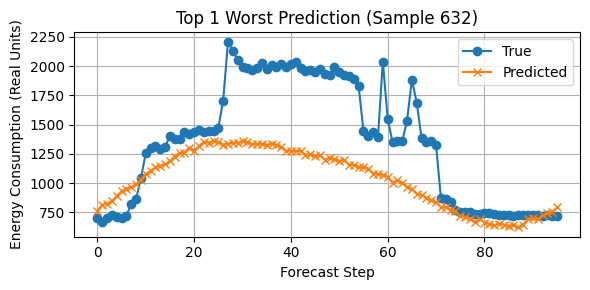

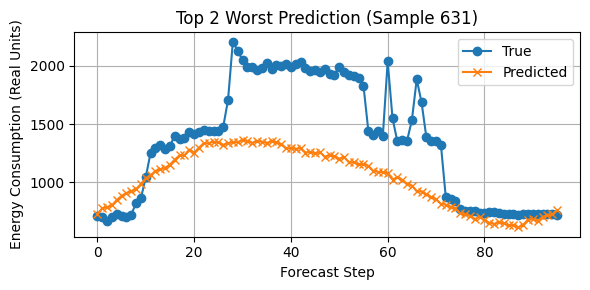

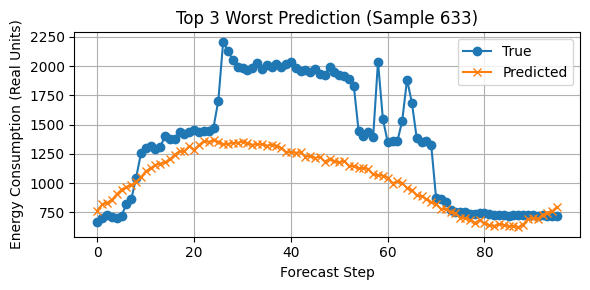

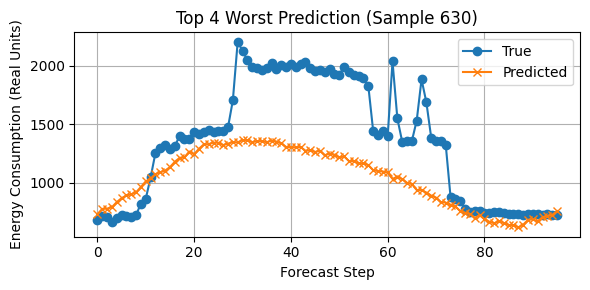

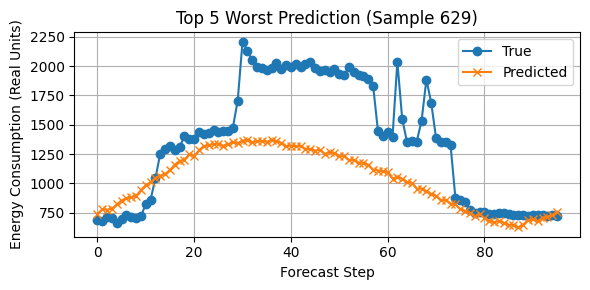

...

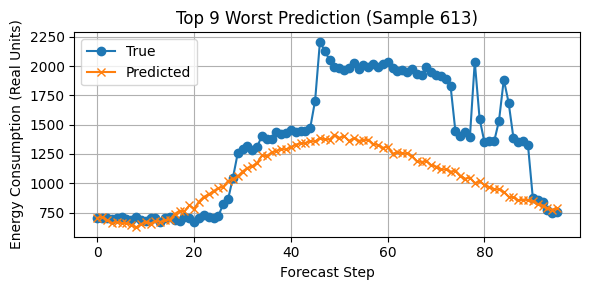

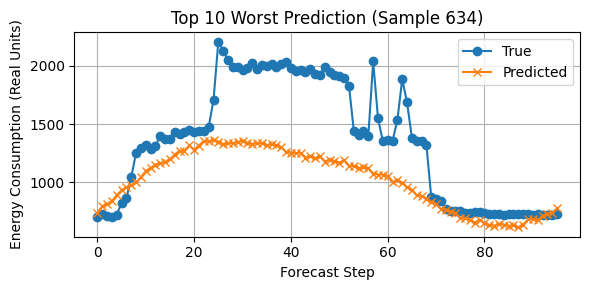

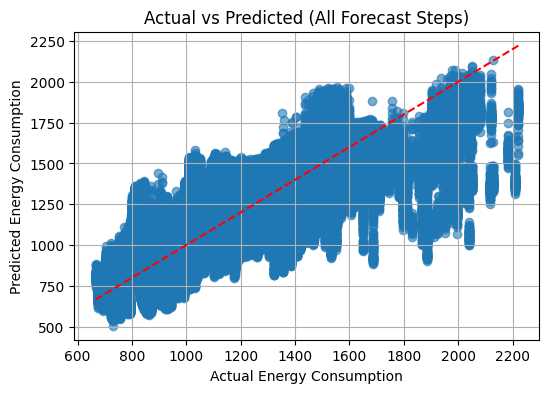

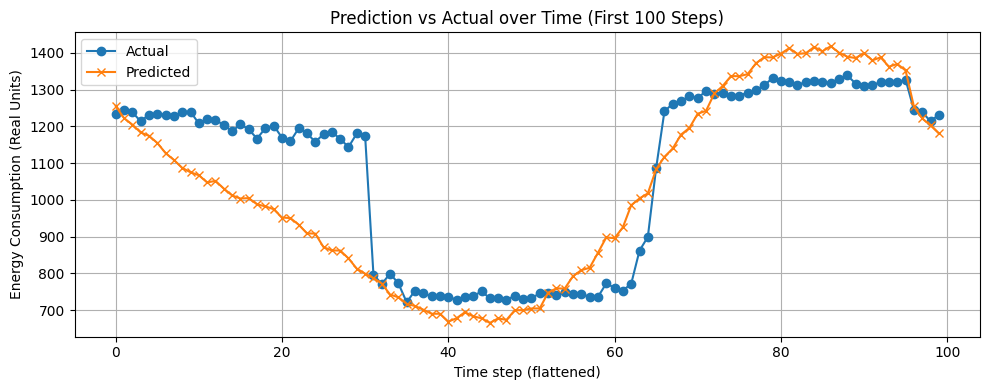

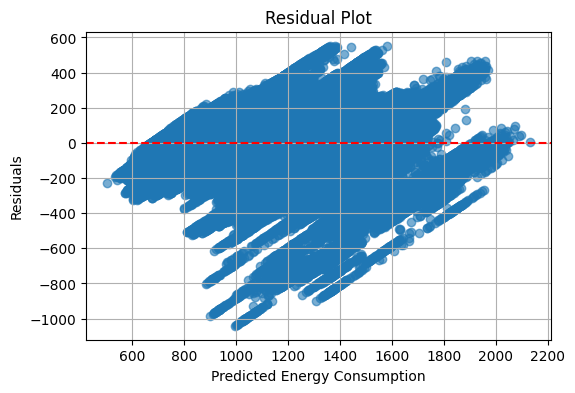

In [ ]:
# tarnsformer Without deccoder without normalization
Transformer_model=Transformer(
        input_size=1,
        d_model=64,
        nhead=4,
        num_encoder_layers=2,
        dim_feedforward=128,
        dropout=.1,
        pred_len=pred_len)

trained_ransformer_model = run_epochs(
    model=Transformer_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device,
    scaler_x=scaler_x,
    scaler_y=scaler_y
  )

Epoch 1/20 | Train Loss: 1725499.6549 | Val Loss: 1358966.4311
Epoch 2/20 | Train Loss: 1489490.3686 | Val Loss: 1146658.5612
Epoch 3/20 | Train Loss: 1274725.0895 | Val Loss: 953866.4953
Epoch 4/20 | Train Loss: 1079294.9103 | Val Loss: 780288.3616
Epoch 5/20 | Train Loss: 903041.3558 | Val Loss: 625855.3757
Epoch 6/20 | Train Loss: 745927.3765 | Val Loss: 490557.2266
Epoch 7/20 | Train Loss: 607962.2134 | Val Loss: 374437.2140
Epoch 8/20 | Train Loss: 489423.6717 | Val Loss: 279403.5307
Epoch 9/20 | Train Loss: 393953.6482 | Val Loss: 209411.0695
Epoch 10/20 | Train Loss: 323285.2320 | Val Loss: 191584.4549
Epoch 11/20 | Train Loss: 272415.0799 | Val Loss: 145773.1679
Epoch 12/20 | Train Loss: 233746.0020 | Val Loss: 115695.5888
Epoch 13/20 | Train Loss: 216998.9851 | Val Loss: 90513.5735
Epoch 14/20 | Train Loss: 205813.5755 | Val Loss: 84844.0026
Epoch 15/20 | Train Loss: 198847.1395 | Val Loss: 81300.8009
Epoch 16/20 | Train Loss: 194047.8502 | Val Loss: 79017.2458
Epoch 17/20 | T

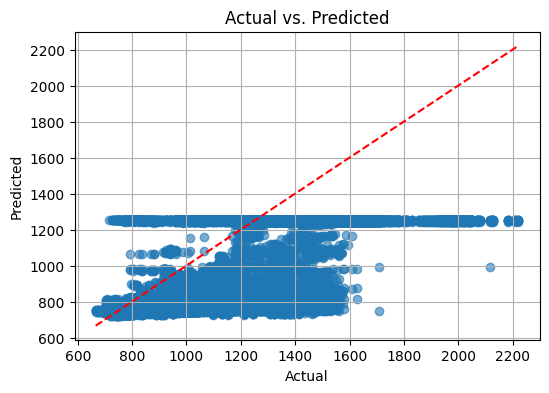

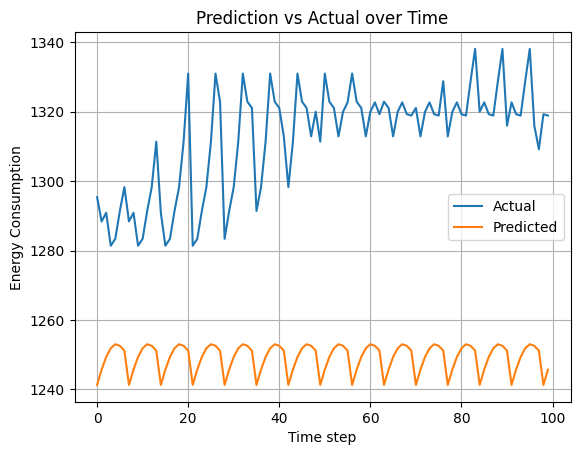

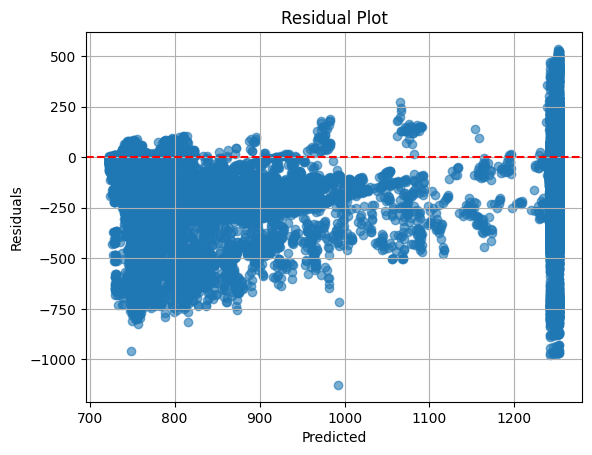

In [ ]:
TransformerBiLSTMr_model=TransformerBiLSTM(
          input_size=1,
    d_model=32,
    nhead=4,
    num_encoder_layers=2,
    dim_feedforward=128,
    dropout=0.1,
    pred_len=7,
    lstm_hidden_size=64,
    lstm_layers=1)
trained_TransformerBiLSTM = run_epochs(
    model=TransformerBiLSTMr_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device
  )

Epoch 1/20 | Train Loss: 0.2008 | Val Loss: 0.1611
Epoch 2/20 | Train Loss: 0.1572 | Val Loss: 0.1186
Epoch 3/20 | Train Loss: 0.1438 | Val Loss: 0.1137
Epoch 4/20 | Train Loss: 0.1377 | Val Loss: 0.1267
Epoch 5/20 | Train Loss: 0.1328 | Val Loss: 0.1231
Epoch 6/20 | Train Loss: 0.1284 | Val Loss: 0.1037
Epoch 7/20 | Train Loss: 0.1244 | Val Loss: 0.1010
Epoch 8/20 | Train Loss: 0.1199 | Val Loss: 0.0933
Epoch 9/20 | Train Loss: 0.1143 | Val Loss: 0.0876
Epoch 10/20 | Train Loss: 0.1126 | Val Loss: 0.0852
Epoch 11/20 | Train Loss: 0.1095 | Val Loss: 0.0997
Epoch 12/20 | Train Loss: 0.1063 | Val Loss: 0.0872
Epoch 13/20 | Train Loss: 0.1072 | Val Loss: 0.0763
Epoch 14/20 | Train Loss: 0.1054 | Val Loss: 0.0739
Epoch 15/20 | Train Loss: 0.1016 | Val Loss: 0.0689
Epoch 16/20 | Train Loss: 0.1028 | Val Loss: 0.0674
Epoch 17/20 | Train Loss: 0.1004 | Val Loss: 0.0677
Epoch 18/20 | Train Loss: 0.0972 | Val Loss: 0.0614
Epoch 19/20 | Train Loss: 0.0970 | Val Loss: 0.0587
Epoch 20/20 | Train L

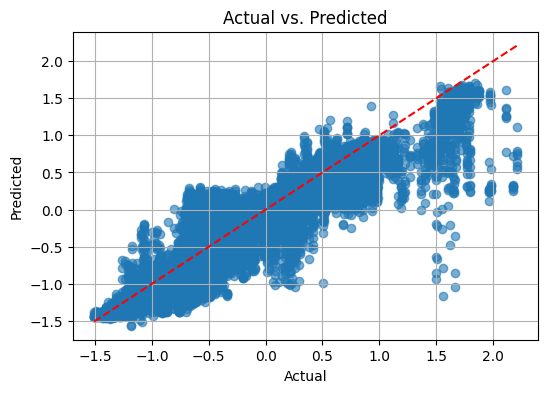

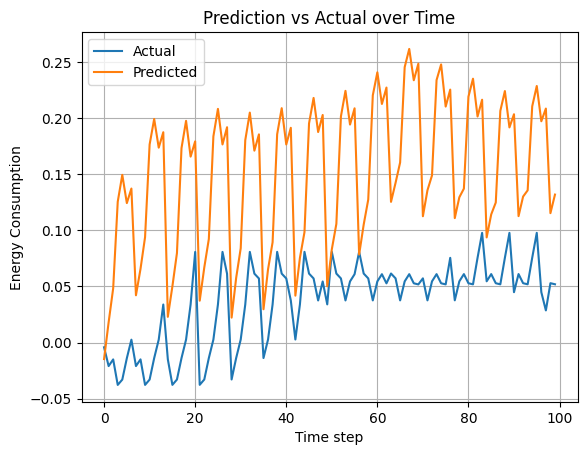

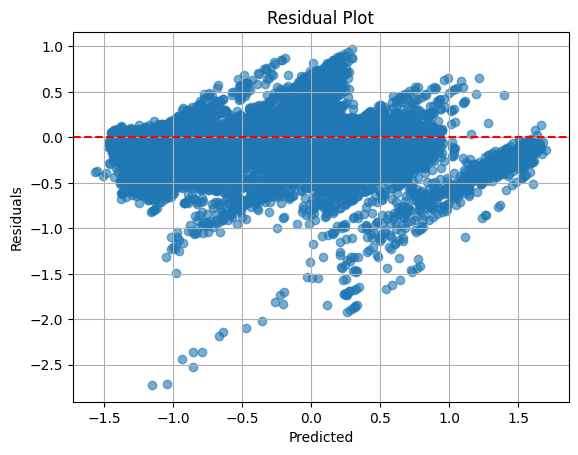

In [ ]:
TransformerLSTM_model = TransformerLSTM(
    input_size=1,
    d_model=32,
    nhead=4,
    num_encoder_layers=2,
    dim_feedforward=128,
    dropout=0.1,
    pred_len=7,
    lstm_hidden_size=64,
    lstm_layers=1

)

TransformerLSTM_trained_Wst= run_epochs(
    model=TransformerLSTM_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device
  )

Sequence On tensor board

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Course/Deep/Project/runs/transformer_energy3
# import os
# os.system('tensorboard --logdir=/content/drive/MyDrive/Course/Deep/Project/runs/transformer_energy')


<IPython.core.display.Javascript object>

Epoch 1/100 | Train Loss: 0.6325 | Val Loss: 0.3527
Epoch 2/100 | Train Loss: 0.2441 | Val Loss: 0.2926
Epoch 3/100 | Train Loss: 0.2162 | Val Loss: 0.1663
Epoch 4/100 | Train Loss: 0.1601 | Val Loss: 0.3273
Epoch 5/100 | Train Loss: 0.2081 | Val Loss: 0.1464
Epoch 6/100 | Train Loss: 0.1504 | Val Loss: 0.1212
Epoch 7/100 | Train Loss: 0.1237 | Val Loss: 0.1130
Epoch 8/100 | Train Loss: 0.1280 | Val Loss: 0.1896
Epoch 9/100 | Train Loss: 0.1437 | Val Loss: 0.1518
Epoch 10/100 | Train Loss: 0.1278 | Val Loss: 0.0823
Epoch 11/100 | Train Loss: 0.1419 | Val Loss: 0.1246
Epoch 12/100 | Train Loss: 0.1126 | Val Loss: 0.0984
Epoch 13/100 | Train Loss: 0.1131 | Val Loss: 0.0844
Epoch 14/100 | Train Loss: 0.1013 | Val Loss: 0.1209
Epoch 15/100 | Train Loss: 0.0945 | Val Loss: 0.0856
Epoch 16/100 | Train Loss: 0.0932 | Val Loss: 0.0756
Epoch 17/100 | Train Loss: 0.0955 | Val Loss: 0.0805
Epoch 18/100 | Train Loss: 0.0896 | Val Loss: 0.0721
Epoch 19/100 | Train Loss: 0.0819 | Val Loss: 0.0792
Ep

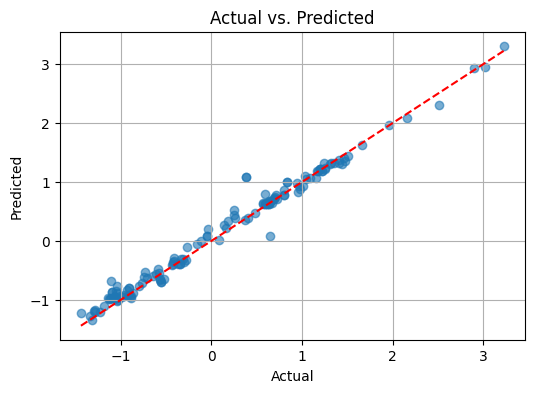

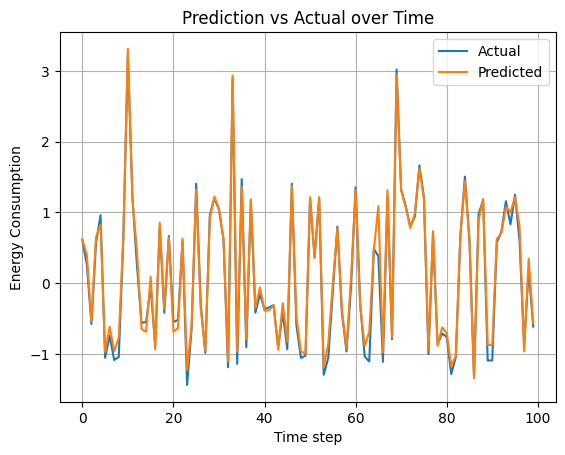

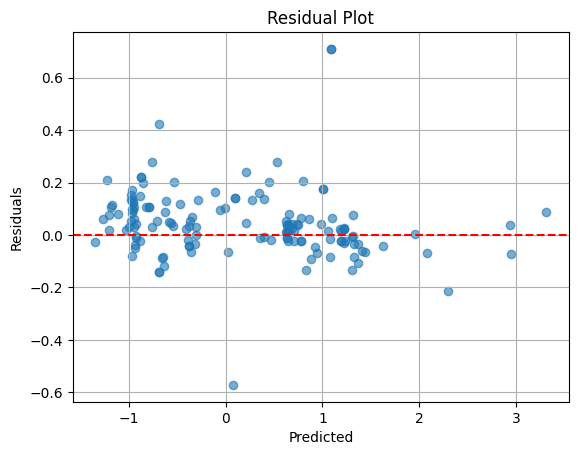

In [ ]:
Custom_model2=CustomTransformerLSTM(
        input_size=1,
        d_model=32,
        nhead=4,
        num_encoder_layers=2,
        lstm_hidden=64,
        num_lstm_layers=1,
        dim_feedforward=128,
        dropout=.1)


trained_Custom_model2 = run_epochs(
    model=Custom_model2,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device
  )

Epoch 1/100 | Train Loss: 0.4239 | Val Loss: 0.2776
Epoch 2/100 | Train Loss: 0.2381 | Val Loss: 0.2348
Epoch 3/100 | Train Loss: 0.1754 | Val Loss: 0.1444
Epoch 4/100 | Train Loss: 0.1453 | Val Loss: 0.1264
Epoch 5/100 | Train Loss: 0.1202 | Val Loss: 0.1168
Epoch 6/100 | Train Loss: 0.1108 | Val Loss: 0.1901
Epoch 7/100 | Train Loss: 0.1205 | Val Loss: 0.0973
Epoch 8/100 | Train Loss: 0.1220 | Val Loss: 0.1312
Epoch 9/100 | Train Loss: 0.0892 | Val Loss: 0.0891
Epoch 10/100 | Train Loss: 0.0870 | Val Loss: 0.0854
Epoch 11/100 | Train Loss: 0.0747 | Val Loss: 0.0711
Epoch 12/100 | Train Loss: 0.0737 | Val Loss: 0.0765
Epoch 13/100 | Train Loss: 0.0780 | Val Loss: 0.0740
Epoch 14/100 | Train Loss: 0.0559 | Val Loss: 0.0753
Epoch 15/100 | Train Loss: 0.0588 | Val Loss: 0.0571
Epoch 16/100 | Train Loss: 0.0756 | Val Loss: 0.0680
Epoch 17/100 | Train Loss: 0.0485 | Val Loss: 0.0599
Epoch 18/100 | Train Loss: 0.0524 | Val Loss: 0.0554
Epoch 19/100 | Train Loss: 0.0508 | Val Loss: 0.0460
Ep

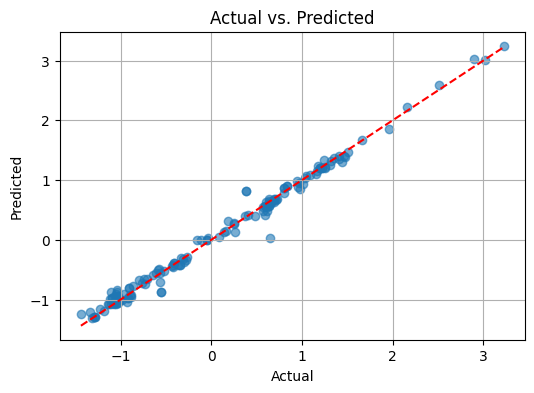

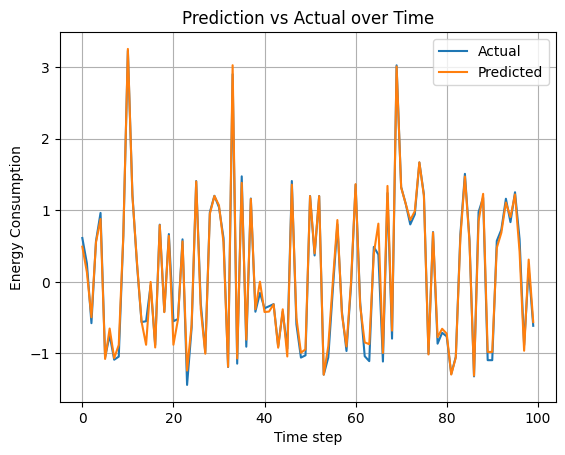

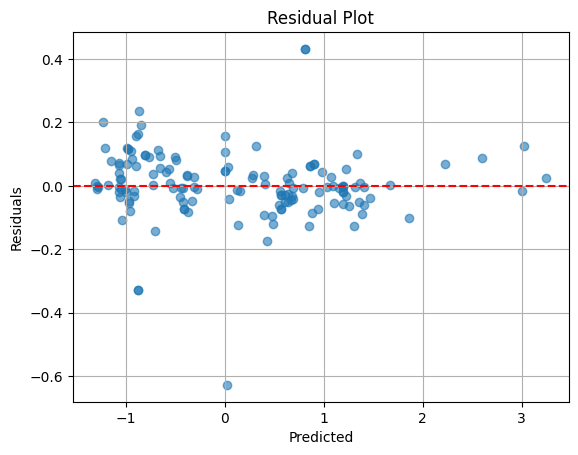

In [ ]:
Custommodel=CustomTransformerLSTM(
        input_size=1,
        d_model=32,
        nhead=4,
        num_encoder_layers=2,
        lstm_hidden=64,
        num_lstm_layers=1,
        dim_feedforward=128,
        dropout=.1)


trained_model = run_epochs(
    model=Custommodel,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device
  )

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch 1/100 | Train Loss: 0.5766 | Val Loss: 0.2752
Epoch 2/100 | Train Loss: 0.2598 | Val Loss: 0.2348
Epoch 3/100 | Train Loss: 0.1944 | Val Loss: 0.2164
Epoch 4/100 | Train Loss: 0.1915 | Val Loss: 0.2969
Epoch 5/100 | Train Loss: 0.1959 | Val Loss: 0.2825
Epoch 6/100 | Train Loss: 0.1921 | Val Loss: 0.1887
Epoch 7/100 | Train Loss: 0.1845 | Val Loss: 0.1668
Epoch 8/100 | Train Loss: 0.1680 | Val Loss: 0.1758
Epoch 9/100 | Train Loss: 0.1743 | Val Loss: 0.1493
Epoch 10/100 | Train Loss: 0.1641 | Val Loss: 0.1981
Epoch 11/100 | Train Loss: 0.1608 | Val Loss: 0.1589
Epoch 12/100 | Train Loss: 0.1372 | Val Loss: 0.1764
Epoch 13/100 | Train Loss: 0.1364 | Val Loss: 0.1296
Epoch 14/100 | Train Loss: 0.1309 | Val Loss: 0.0995
Epoch 15/100 | Train Loss: 0.1325 | Val Loss: 0.2282
Epoch 16/100 | Train Loss: 0.1827 | Val Loss: 0.2376
Epoch 17/100 | Train Loss: 0.1823 | Val Loss: 0.2066
Epoch 18/100 | Train Loss: 0.2069 | Val Loss: 0.2024
Epoch 19/100 | Train Loss: 0.1716 | Val Loss: 0.1740
Ep

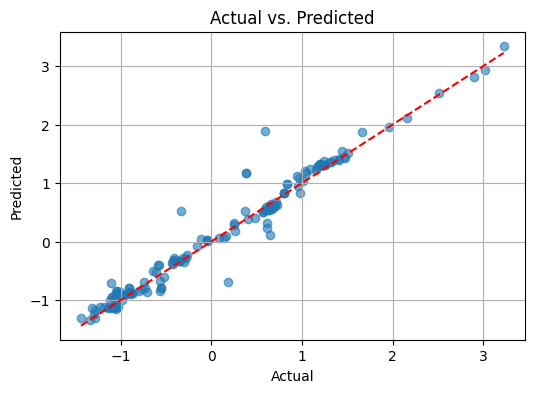

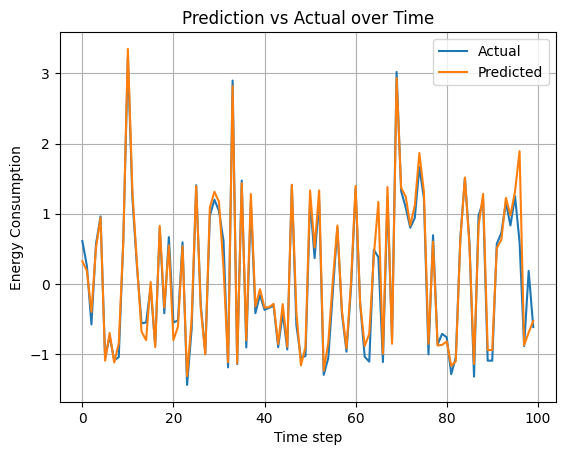

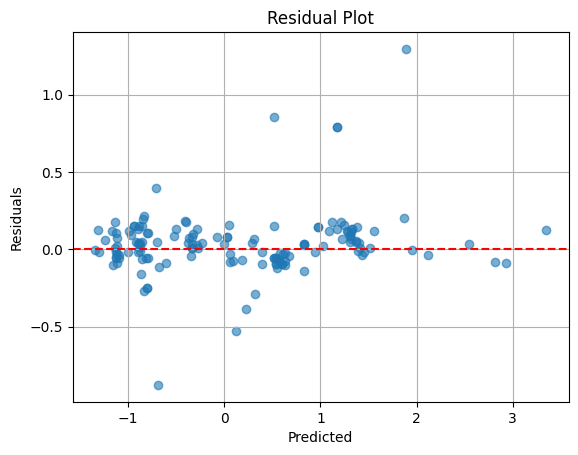

In [ ]:
TransformerLSTM_model = TransformerLSTM(
    input_size=1,
    d_model=32,
    nhead=4,
    num_encoder_layers=2,
    lstm_hidden=64,
    num_lstm_layers=1
)

TransformerLSTM_trained_Wst= run_epochs(
    model=TransformerLSTM_model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=lr,
    device=device
  )

***test on unseen data***

*TransformerLSTM*

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([7])) that is different to the input size (torch.Size([1, 7])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Best Val Loss: 0.7898
RMSE: 0.8874
MAE: 0.6755


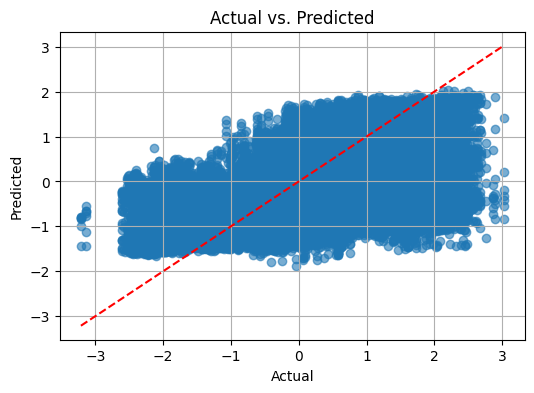

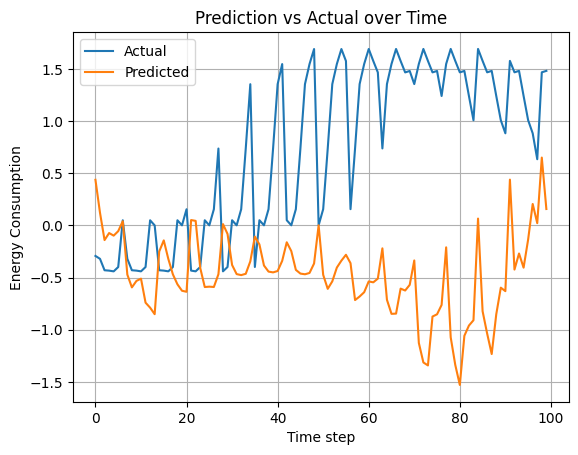

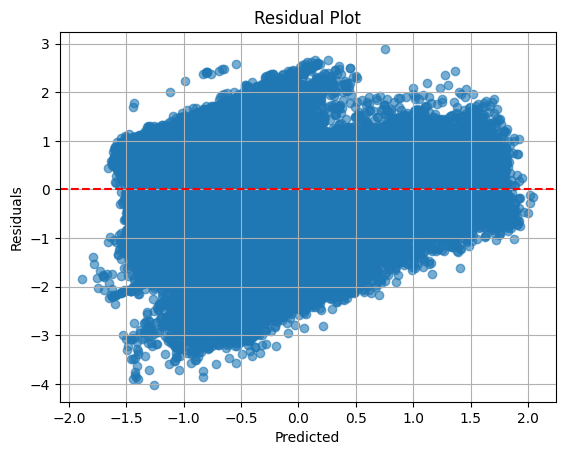

In [ ]:


    train_loader1, val_loader1,X_date_seq1, y_data_seq1, scaler_x1, scaler_y1 = get_data_loaders2('/content/drive/MyDrive/Course/Deep/Project/Dataset/electricity-1.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)


    TransformerBiLSTMr_model.load_state_dict(trained_TransformerBiLSTM)
    optimizer = torch.optim.Adam(TransformerBiLSTMr_model.parameters(), lr=lr)

    criterion = torch.nn.MSELoss()
    avg_val_loss,predictions,actuals = validating(TransformerBiLSTMr_model, train_loader1, criterion,device)
    print(f"Best Val Loss: {avg_val_loss:.4f}")
    writer.close()
    evaluate_model(predicts=np.array(predictions.view(-1).tolist()), actuals=np.array(actuals.view(-1).tolist()))

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([7])) that is different to the input size (torch.Size([1, 7])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Best Val Loss: 0.7799
RMSE: 0.8828
MAE: 0.6428


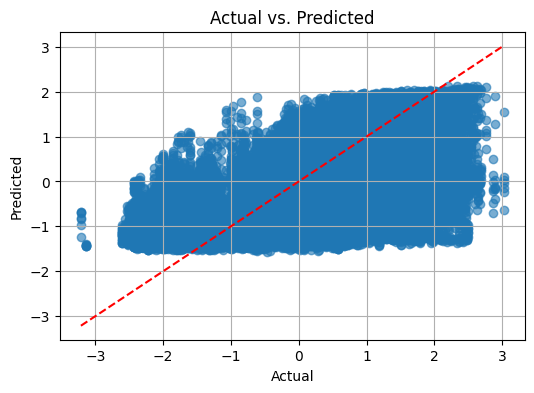

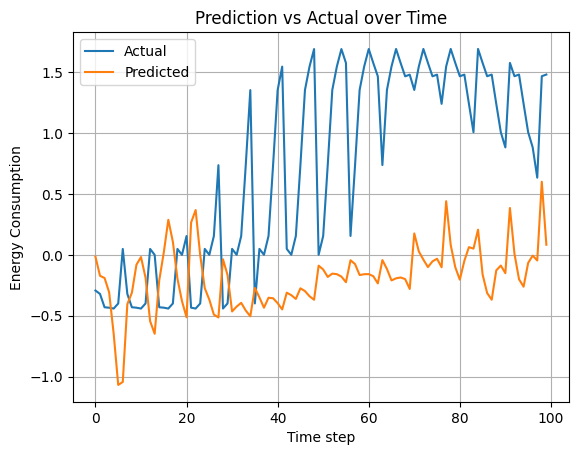

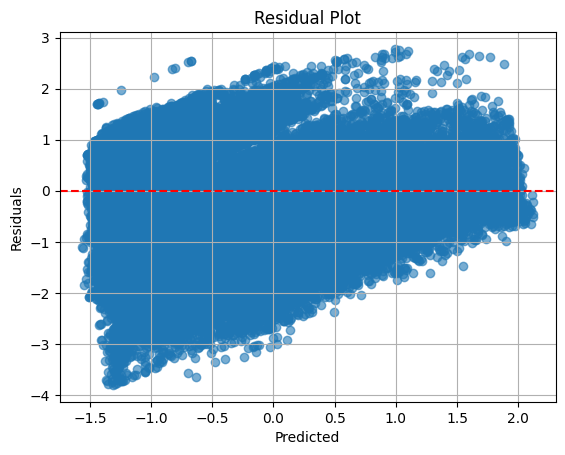

In [ ]:
    train_loader1, val_loader1,X_date_seq1, y_data_seq1, scaler_x1, scaler_y1 = get_data_loaders2('/content/drive/MyDrive/Course/Deep/Project/Dataset/electricity-1.xlsx',batch_size=batch_size,L=L,pred_len=pred_len)


    TransformerLSTM_model.load_state_dict(TransformerLSTM_trained_Wst)
    optimizer = torch.optim.Adam(TransformerLSTM_model.parameters(), lr=lr)

    criterion = torch.nn.MSELoss()
    avg_val_loss,predictions,actuals = validating(TransformerLSTM_model, train_loader1, criterion,device)
    print(f"Best Val Loss: {avg_val_loss:.4f}")
    writer.close()
    evaluate_model(predicts=np.array(predictions.view(-1).tolist()), actuals=np.array(actuals.view(-1).tolist()))

*Custom  TransforLSTM*

Best Val Loss: 0.1615
RMSE: 0.4024
MAE: 0.2308


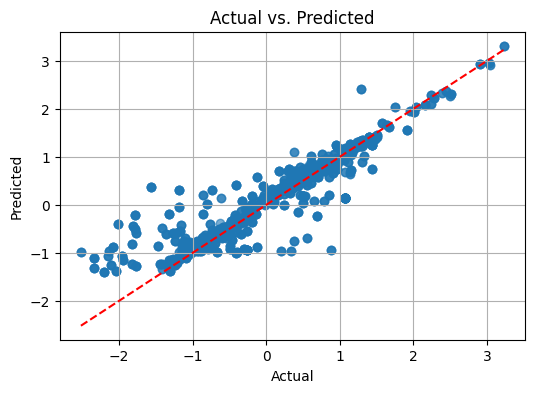

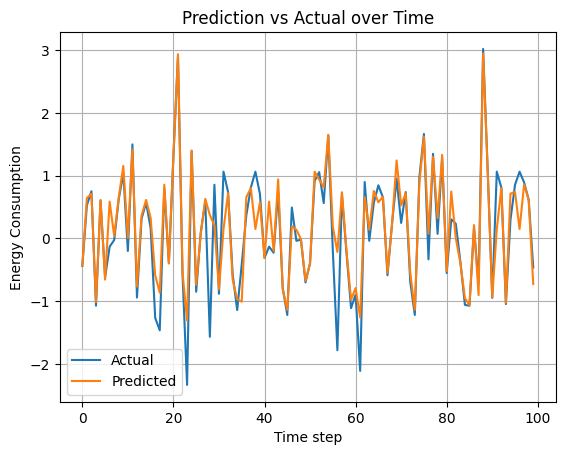

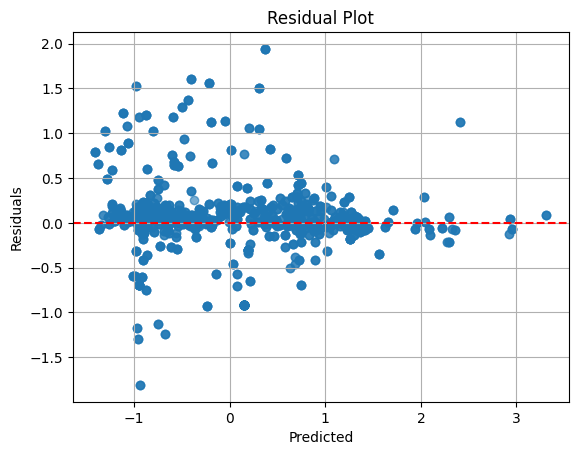

In [ ]:
    train_loader1, val_loader1, scaler_y1= get_data_loaders2('/content/drive/MyDrive/Course/Deep/Project/Dataset/electricity-1.xlsx',batch_size=64)


    Custom_model2.load_state_dict(trained_Custom_model2)
    optimizer = torch.optim.Adam(Custom_model2.parameters(), lr=lr)
    criterion = torch.nn.MSELoss()
    avg_val_loss,predictions,actuals = validating(Custom_model2, train_loader1, criterion,device)
    print(f"Best Val Loss: {avg_val_loss:.4f}")
    writer.close()
    evaluate_model(predicts=np.array(predictions.view(-1).tolist()), actuals=np.array(actuals.view(-1).tolist()))
